# Model Training & Evaluating

In the following notebook, we will train Light GBM, Catboost and XGBoost Classifier, to predict the probability in which league a player might land.

As maine evalauation metric we will use the Log Loss, because we want to predict the probability of a pleyer moving to a certain league. The dataset shows mild inbalance, therefore we will use as secondary evalauation metrices we will use macro f1-score, precision and recall.

We will use macro, because it allow us to evaluate each class seperatley/globally, which allows us to get a fair compression between the different classes of the target variable.

**Precison**
Of all predictions the model made for a class (positives), how many were actually correct (true positives). True Positives/(True Positives +  False Positive). In our case, out of predicting Bundesliga players how many times did the model predict it correctly against called it Bundesliga, even though the data did not belong their.

**Recall**
Of all actual samples belonging to a class, how many did the model correctly identify (true positives). True Positives/(True Positives +  False Negative). In our case, out of predicting Bundesliga players how many times did the model predict it correctly, against not calling it Bundesliga, even though the data did belong their.

**F1-Score**
Combination out of precision and recall, combines all good aspects out of both words.

**Log Loss**
Log Loss is a logarithmic transformation of the likelihood function, primarily used to evaluate the performance of probabilistic classifiers. Log loss can be applied for multiclass problems, and it is a good metric, when imbalance is existing.It punishes overconfident wrong predictions.

**Note: to calaculate a representive Log Loss we get the log of 1/6, because we have 6 unique classes.**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split,RepeatedStratifiedKFold,cross_val_score,StratifiedGroupKFold,learning_curve,LearningCurveDisplay
from sklearn.metrics import make_scorer,f1_score,log_loss,classification_report, confusion_matrix, ConfusionMatrixDisplay,top_k_accuracy_score
from sklearn.pipeline import Pipeline
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.calibration import CalibratedClassifierCV
from sklearn.utils.class_weight import compute_class_weight,compute_sample_weight
from sklearn.preprocessing import FunctionTransformer
from sklearn.base import clone
from sklearn.metrics import log_loss
from lightgbm import LGBMClassifier
from lightgbm.callback import early_stopping
from catboost import CatBoostClassifier
from catboost import Pool
import xgboost
from xgboost import XGBClassifier
from ngboost import NGBClassifier
from ngboost.distns import Bernoulli
from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import RobustScaler,LabelEncoder
from sklearn.base import BaseEstimator, TransformerMixin
from scipy.stats import zscore
from feature_engine.encoding import RareLabelEncoder,OneHotEncoder,MeanEncoder
from category_encoders import CatBoostEncoder
import optuna
from optuna.samplers import TPESampler,CmaEsSampler
from optuna.pruners import SuccessiveHalvingPruner,HyperbandPruner
from optuna.integration import LightGBMPruningCallback,XGBoostPruningCallback
import optuna.visualization.matplotlib as optuna_matplotlib
import joblib
from joblib import Parallel, delayed, Memory
import time
import sys
import os
import warnings
import shap
sys.path.append('..\..\src')
from PY_Class_Def import Feature_Selector_Classification,save_model_performance,ClubWeightadder,TopClubTransformer,LeagueWeightEncoder,TopLeagueTransformer,NewFeatureCreate,PositionScore,FixedLabelLogLoss,who_is_that_player
from transfer_target_data_cleaning import top_or_others,league_class_trans

df=pd.read_csv(r"..\..\DataSources\Processed\Final_Stats_2000_2025_test.csv").iloc[:,1:]
for c in [('Top_Left','League_Left'),('Top_Joined','League_Joined')]:
    df[c[0]]=df[c[1]].apply(lambda x: 1 if x in ['Premier League','LaLiga','Bundesliga','Serie A','Ligue 1','Eredivisie','Liga Portugal'] else 0)
df=df[(df['Top_Left']==1) | (df['Top_Joined']==1)].iloc[:,:-2]
df['League_Joined']=df['League_Joined'].map(top_or_others)
#df['League_Joined'].unique()
df.to_csv("..\..\DataSources\Processed\Cleaned_Final_Stats_test.csv",index=False)

In [ ]:
df=pd.read_csv(r'..\..\DataSources\Processed\Cleaned_Final_Stats.csv')
df.head()

,Player,Nation,Squad,Pos,Age,League,MP,Starts,Min,90s,...,AvgDist,Limited_Time,Age_Num,Transfer_Window,Club_Left,League_Left,Club_Joined,League_Joined,Transfer_Fee,Performance_Year
0,Aaron Connolly,IRL,Brighton,FW,Early Twenties,Premier League,10.5,5.0,473.5,5.25,...,0.0,0.5,20.5,2022,Brighton & Hove Albion,Premier League,Venezia FC,Other Leagues,0.0,2021.0
1,Aaron Connolly,IRL,Brighton,FW,Early Twenties,Premier League,10.5,5.0,473.5,5.25,...,0.0,0.5,20.5,2022,Brighton & Hove Albion,Premier League,Hull City,Other Leagues,0.0,2021.0
2,Aaron Hickey,GBR,Bologna,DF,Teenager,Serie A,23.5,22.0,1789.0,19.85,...,0.0,0.5,18.5,2022,FC Bologna,Serie A,FC Brentford,Premier League,14250000.0,2021.0
3,Aaron Leya Iseka,BEL,Toulouse,FW,Early Twenties,Ligue 1,25.0,10.5,1110.5,12.30,...,0.0,0.0,20.5,2020,FC Toulouse,Ligue 2,FC Metz,Ligue 1,0.0,2019.0
4,Aaron Mooy,AUT,Brighton,MF,Late Twenties,Premier League,31.0,25.0,2085.0,23.20,...,0.0,0.0,28.0,2020,Brighton & Hove Albion,Premier League,Shanghai Port,Other Leagues,4500000.0,2019.0


In [6]:
(df['League_Joined'].value_counts()/len(df))*100

League_Joined
Other Leagues     28.089561
Serie A           21.605118
LaLiga            14.713580
Premier League    14.073859
Ligue 1           11.078802
Bundesliga        10.439081
Name: count, dtype: float64

In [27]:
X=df.drop(['Player','Squad','League','League_Joined','Club_Joined','Transfer_Fee'],axis=1).copy()
y=df['League_Joined']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.25, stratify=y,random_state=101)
#using the val set to split it into calibrating for CalibratorClassifier and the final test set for teh final evaluation
X_cal, X_test, y_cal, y_test = train_test_split(X_val, y_val, test_size=0.5, stratify=y_val,random_state=101)

#for the group CV
#we need to create a identifier, which aussres that duplicated values are addressed in the cross validation
group=df['Player'].str.strip().str.lower()
groups_train=group[X_train.index]
#appropriate cv method, when we have duplicate values like players and we want to make sure that they appear in the same folds
##so the models does not have any leakage
cv=StratifiedGroupKFold(n_splits=5,shuffle=True,random_state=101)

#tree-based models like Light GBM needs class weights to address inbalance in multiclass classifications
classes_sorted=np.array(sorted(y_train.unique()))
weights=compute_class_weight(class_weight='balanced',classes=classes_sorted,y=y_train)
lgb_xgb_class_weight={cls:w for cls,w in zip(classes_sorted,weights)}
cat_boost_weights=weights.tolist()

num_class=len(y_train.unique())

#creating a make_scorer, which addresses all classes
log_loss_score=FixedLabelLogLoss(classes_sorted)

In [11]:
X=df.drop(['Player','Squad','League','League_Joined','Club_Joined','Transfer_Fee'],axis=1).copy()
y=df['League_Joined']
players = df['Player'].str.strip().str.lower()

#for the group CV
#we need to create a identifier, which aussres that duplicated values are addressed in the cross validation
# take the first split as train vs test
#setting n_splits=5 -> 20% test; n_splits=10 -> 30% test
# 1) Group-aware TRAIN/TEST (≈80/20 with SGKF n_splits=5)
sgkf_outer = StratifiedGroupKFold(n_splits=5, shuffle=True, random_state=101)
train_idx, test_idx = next(sgkf_outer.split(X, y, groups=players))
X_train_all, X_test = X.iloc[train_idx], X.iloc[test_idx]
y_train_all, y_test = y.iloc[train_idx], y.iloc[test_idx]
groups_train_all = players.iloc[train_idx].reset_index(drop=True)

# 2) From TRAIN portion, make FIT / CAL (≈80/20 of TRAIN)
sgkf_cal = StratifiedGroupKFold(n_splits=5, shuffle=True, random_state=202)
fit_idx, cal_idx = next(sgkf_cal.split(X_train_all, y_train_all, groups_train_all))
X_train, X_cal = X_train_all.iloc[fit_idx], X_train_all.iloc[cal_idx]
y_train, y_cal = y_train_all.iloc[fit_idx], y_train_all.iloc[cal_idx]
groups_fit = groups_train_all.iloc[fit_idx].reset_index(drop=True)

le = LabelEncoder().fit(y_train)
y_train_enc = le.transform(y_train)
y_cal_enc = le.transform(y_cal)
y_test_enc = le.transform(y_test)

#tree-based models like Light GBM needs class weights to address inbalance in multiclass classifications
classes_sorted=np.array(sorted(y_train.unique()))
weights=compute_class_weight(class_weight='balanced',classes=classes_sorted,y=y_train)
lgb_xgb_class_weight={cls:w for cls,w in zip(classes_sorted,weights)}
cat_boost_weights=weights.tolist()

num_class=len(y_train.unique())

# 5) Inner CV for HPO (group-aware on FIT only)
cv = StratifiedGroupKFold(n_splits=5, shuffle=True, random_state=101)
# -> use: for tr_idx, val_idx in cv.split(X_fit, y_fit, groups_fit): ...
#    and keep all preprocessing inside your Pipeline per fold

#creating a make_scorer, which addresses all classes
log_loss_score=FixedLabelLogLoss(classes_sorted)

In [29]:
print(f'Basline Log Loss Score that the model needs to beat: {-np.log(1/6)}')

Basline Log Loss Score that the model needs to beat: 1.791759469228055


In [20]:
X_train.head()

,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,G+A,...,Stp%,#OPA,#OPA/90,AvgDist,Limited_Time,Age_Num,Transfer_Window,Club_Left,League_Left,Performance_Year
2,GBR,DF,Teenager,23.5,22.0,1789.0,19.85,2.5,0.5,3.0,...,0.0,0.0,0.0,0.0,0.5,18.5,2022,FC Bologna,Serie A,2021.0
10,GBR,MF,Late Twenties,26.0,17.5,1588.5,17.65,5.5,7.0,12.5,...,0.0,0.0,0.0,0.0,0.0,26.5,2019,FC Arsenal,Premier League,2018.0
11,GBR,MF,Late Twenties,23.0,12.0,1070.0,11.90,2.5,2.5,5.0,...,0.0,0.0,0.0,0.0,0.0,28.5,2021,Juventus Turin,Serie A,2020.0
12,GBR,MF,Early Thirties,27.0,18.0,1584.0,17.60,1.0,1.0,2.0,...,0.0,0.0,0.0,0.0,0.0,31.0,2023,Aston Villa U21,Premier League 2,2022.0
13,GBR,MF,Early Thirties,27.0,18.0,1584.0,17.60,1.0,1.0,2.0,...,0.0,0.0,0.0,0.0,0.0,31.0,2023,OGC Nizza,Ligue 1,2022.0


## Creating the Pipeline

In [21]:
test_pipeline=Pipeline(
    [
        ('NewFeatures',NewFeatureCreate()),
        ('Club_weight', ClubWeightadder(columns=['Club_Left'],top_club_weights={'Manchester City': 27,'Real Madrid': 26,'FC Bayern München': 25,'FC Paris Saint-Germain': 24,'Inter Mailand': 23,'FC Barcelona': 22,
                                            'FC Arsenal': 21,'FC Liverpool': 20,'Atlético Madrid': 19,'Borussia Dortmund': 18,'Juventus Turin': 17,'AC Mailand': 16,'Manchester United': 15,'RasenBallsport Leipzig': 14,
                                            'FC Chelsea': 13,'SSC Neapel': 12,'Newcastle United': 11,'Bayer 04 Leverkusen': 10,'AS Monaco': 9,'Olympique Marseille': 8,'Ajax Amsterdam': 7,'FC Porto': 6,'Benfica Lissabon': 5,
                                            'Sporting Lissabon': 4,'Galatasaray': 3,'Fenerbahce': 2,'Tottenham Hotspur': 1},non_top_weight=0.05)),
        ('TopClubs',TopClubTransformer(columns=[('Club_Left','League_Left')])),
        ('League_Weight',LeagueWeightEncoder(top_league_weights={'Premier League': 5,'LaLiga': 4,'Bundesliga': 3,'Serie A': 2,'Ligue 1': 1 },columns=['League_Left'])),
        ('TopLeague',TopLeagueTransformer(['League_Left'])),
        ('Nation Binning',RareLabelEncoder(variables='Nation',tol=0.005)),
        ('Club_Left Binning', RareLabelEncoder(variables='Club_Left',tol=0.0035)),
        ##('League_Left Binning', RareLabelEncoder(variables='League_Left',tol=0.001)),
        ('One-Hot Encoder',OneHotEncoder(variables=['Age','Pos'],drop_last=True)),
        ('Position_Score_FW', PositionScore(pos='FW', balanced_classes=True)),
        ('Position_Score_MF', PositionScore(pos='MF', balanced_classes=True)),
        ('Position_Score_DF', PositionScore(pos='DF', balanced_classes=True)),
        ('Position_Score_GK', PositionScore(pos='GK', balanced_classes=True)),
        ('Class Target Encoding',CatBoostEncoder(cols=['Nation','Club_Left','League_Left'],random_state=101)),
        ('Feature Selector Classification',Feature_Selector_Classification(threshold=0.0055, random_state=101))
    ]
)
test_pipeline.fit(X_train,y_train)
df_test=test_pipeline.transform(X_train)
df_test.head()

,Lost,Progressive_Passes_Received_90s,Pass,Starts,Dribblers_Tackeld,PrgP_90s,xContrib_per_Touch_90s,Short_Cmp%,Touch_Stability_90s,Prog_Passing_Eff,...,Performance_Score_Creativity,Clear_Rate_90,TklW_90s,Shot_lead_to_Shot_Att,Int_90s,Dual_Threat,Shot_Creating_Action_90,Live_Pass_lead_Goal,Total Tackels_90s,Nation
2,10.0,4.634761,14.0,22.0,13.5,2.216625,0.000070,91.45,0.258186,3.549229,...,-0.085523,1.486146,0.931990,0.5,1.108312,0.526316,1.115,2.5,1.460957,3.388718
10,27.0,8.328612,8.5,17.5,7.5,6.288952,0.000391,88.25,0.143716,3.168906,...,1.574392,0.254958,1.274788,3.0,0.934844,1.283784,3.160,9.5,1.954674,3.388718
11,17.5,7.436975,13.0,12.0,7.0,5.462185,0.000535,90.25,0.227168,2.852459,...,1.237676,0.840336,1.218487,2.0,0.756303,1.522727,4.490,4.5,1.764706,3.388718
12,23.0,4.772727,21.0,18.0,16.0,7.159091,0.000191,92.30,0.160240,3.500919,...,0.691399,1.022727,1.420455,5.0,0.965909,1.388889,3.520,2.0,2.670455,3.388718
13,23.0,4.772727,21.0,18.0,16.0,7.159091,0.000191,92.30,0.160240,3.500919,...,0.747815,1.022727,1.420455,5.0,0.965909,1.388889,3.520,2.0,2.670455,3.388718


## Logistic Regression (Base Line Model)

c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\_experimental.py:32: ExperimentalWarning: Argument ``multivariate`` is an experimental feature. The interface can change in the future.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\_experimental.py:32: ExperimentalWarning: Argument ``group`` is an experimental feature. The interface can change in the future.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\_experimental.py:32: ExperimentalWarning: Argument ``constant_liar`` is an experimental feature. The interface can change in the future.
  warnings.warn(
[I 2025-09-20 20:12:35,771] A new study created in memory with name: no-name-0490199c-1786-4461-a2c3-96349998c69f
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Li

Best Params: {'nation_tol': 0.009954360214176455, 'club_left_tol': 0.009926191379924773, 'feature_select_thresh': 0.008016266851383607, 'penalty': None, 'tol': 0.0002757661657131087, 'max_iter': 259, 'C': 9.857671904770726, 'l1_ratio': 0.4046321727506626, 'solver': 'newton-cg'}
Best Score: 1.5793589173715372
Run Time: 104.36 Minutes


C:\Users\gandj\AppData\Local\Temp\ipykernel_22768\2904721316.py:63: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  optuna_matplotlib.plot_optimization_history(study)


<Figure size 1000x600 with 0 Axes>

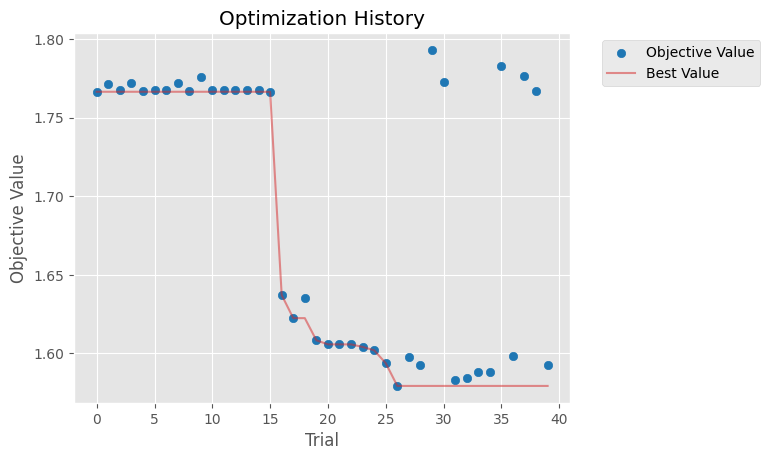

C:\Users\gandj\AppData\Local\Temp\ipykernel_22768\2904721316.py:67: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  optuna_matplotlib.plot_param_importances(study)


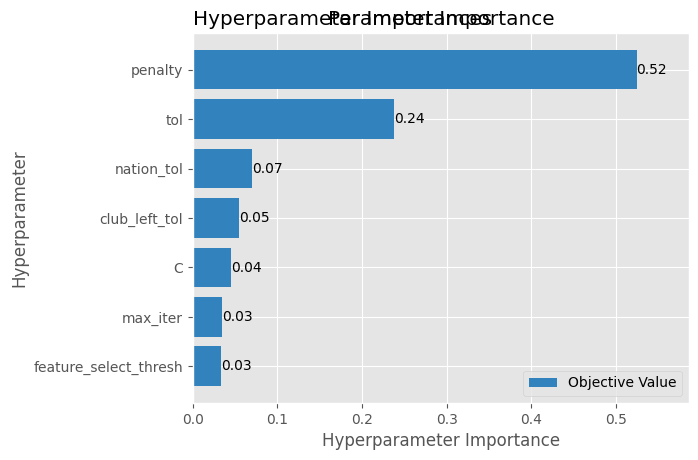

c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\_experimental.py:32: ExperimentalWarning: Argument ``multivariate`` is an experimental feature. The interface can change in the future.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\_experimental.py:32: ExperimentalWarning: Argument ``group`` is an experimental feature. The interface can change in the future.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\_experimental.py:32: ExperimentalWarning: Argument ``constant_liar`` is an experimental feature. The interface can change in the future.
  warnings.warn(
[I 2025-09-20 21:56:58,091] A new study created in memory with name: no-name-54a1eec1-cbab-4ea3-9677-dc72afd51561
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Li

Best Params: {'nation_tol': 0.007424549268690043, 'club_left_tol': 0.008431102859340721, 'feature_select_thresh': 0.010365079410961134, 'tol': 0.0003062096220237091, 'max_iter': 193, 'C': 7.270680507817651, 'l1_ratio': 0.5221278552372438}
Best Score: 1.5469133569651654
Run Time: 152.19 Minutes


C:\Users\gandj\AppData\Local\Temp\ipykernel_22768\2904721316.py:139: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  optuna_matplotlib.plot_optimization_history(study_second_run)


<Figure size 1000x600 with 0 Axes>

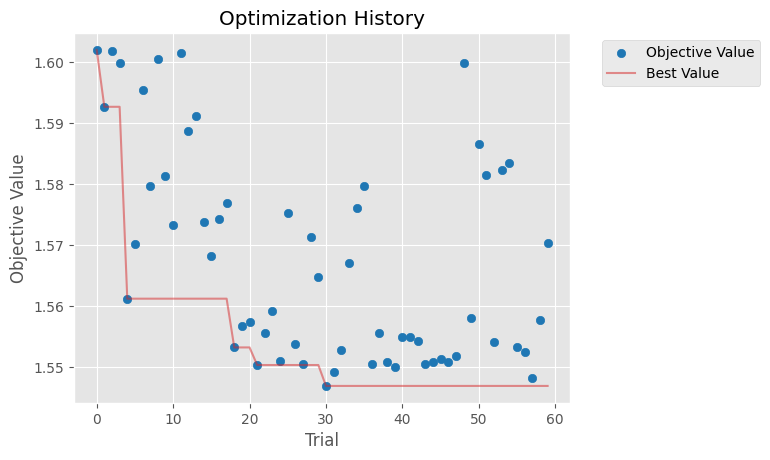

C:\Users\gandj\AppData\Local\Temp\ipykernel_22768\2904721316.py:143: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  optuna_matplotlib.plot_param_importances(study_second_run)


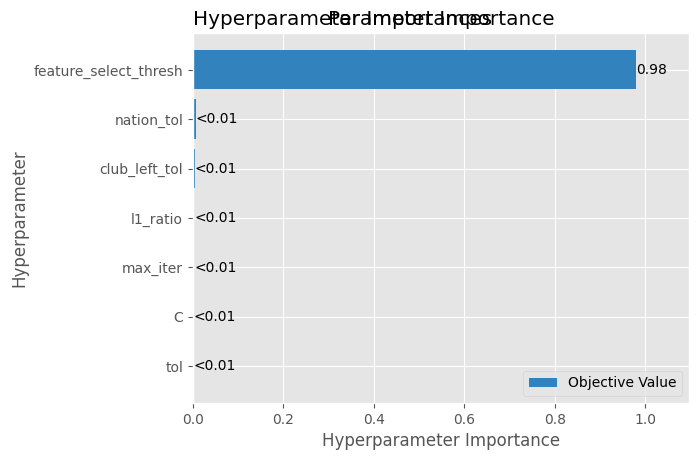

In [22]:
def stage1(trial):
    nation_tol=trial.suggest_float('nation_tol',0.001,0.01)
    club_left_tol=trial.suggest_float('club_left_tol',0.001,0.01)
    feature_select_thresh=trial.suggest_float('feature_select_thresh',0.0001,0.0085)

    logist_params={
        'penalty':trial.suggest_categorical('penalty',[None,'l2','l1','elasticnet']),
        'tol':trial.suggest_float('tol',0.0001,0.001,log=True),
        'max_iter':trial.suggest_int('max_iter',100,500),
        'C':trial.suggest_float('C',0.01,10)
    }
    if logist_params['penalty']=='l2' or logist_params['penalty']=='l1':
        logist_params['l1_ratio']=None
    else:
        logist_params['l1_ratio']=trial.suggest_float('l1_ratio',0.1,0.7)

    if (logist_params['penalty']=='l1'):
        logist_params['solver']='saga'
    elif logist_params['penalty']=='elasticnet':
        logist_params['solver']='saga'
    else:
         logist_params['solver']=trial.suggest_categorical('solver',['lbfgs', 'newton-cg', 'sag', 'saga'])


    logistic_pipeline=Pipeline(
    [
        ('NewFeatures',NewFeatureCreate()),
        ('Club_weight', ClubWeightadder(columns=['Club_Left'],top_club_weights={'Manchester City': 27,'Real Madrid': 26,'FC Bayern München': 25,'FC Paris Saint-Germain': 24,'Inter Mailand': 23,'FC Barcelona': 22,
                                            'FC Arsenal': 21,'FC Liverpool': 20,'Atlético Madrid': 19,'Borussia Dortmund': 18,'Juventus Turin': 17,'AC Mailand': 16,'Manchester United': 15,'RasenBallsport Leipzig': 14,
                                            'FC Chelsea': 13,'SSC Neapel': 12,'Newcastle United': 11,'Bayer 04 Leverkusen': 10,'AS Monaco': 9,'Olympique Marseille': 8,'Ajax Amsterdam': 7,'FC Porto': 6,'Benfica Lissabon': 5,
                                            'Sporting Lissabon': 4,'Galatasaray': 3,'Fenerbahce': 2,'Tottenham Hotspur': 1},non_top_weight=0.05)),
        ('TopClubs',TopClubTransformer(columns=[('Club_Left','League_Left')])),
        ('League_Weight',LeagueWeightEncoder(top_league_weights={'Premier League': 5,'LaLiga': 4,'Bundesliga': 3,'Serie A': 2,'Ligue 1': 1 },columns=['League_Left'])),
        ('TopLeague',TopLeagueTransformer(['League_Left'])),
        ('Nation Binning',RareLabelEncoder(variables='Nation',tol=nation_tol)),
        ('Club_Left Binning', RareLabelEncoder(variables='Club_Left',tol=club_left_tol)),
        ##('League_Left Binning', RareLabelEncoder(variables='League_Left',tol=0.001)),
        ('One-Hot Encoder',OneHotEncoder(variables=['Age','Pos'],drop_last=True)),
        ('Position_Score_FW', PositionScore(pos='FW', balanced_classes=True)),
        ('Position_Score_MF', PositionScore(pos='MF', balanced_classes=True)),
        ('Position_Score_DF', PositionScore(pos='DF', balanced_classes=True)),
        ('Position_Score_GK', PositionScore(pos='GK', balanced_classes=True)),
        ('Class Target Encoding',CatBoostEncoder(cols=['Nation','Club_Left','League_Left'],random_state=101)),
        ('Feature Selector Classification',Feature_Selector_Classification(threshold=feature_select_thresh, random_state=101)),
        ('Logistic Regression',LogisticRegression(**logist_params,class_weight='balanced',multi_class='multinomial',n_jobs=-1,random_state=101))
    ]
    )
    #by adding the make_scorer with the def function 
    scores=cross_val_score(logistic_pipeline,X_train,y_train,cv=cv,groups=groups_fit,scoring=log_loss_score,n_jobs=1)
    return -scores.mean()

study=optuna.create_study(direction='minimize',sampler=TPESampler(multivariate=True,group=True,constant_liar=True,n_startup_trials=15,seed=101),
                                    pruner=SuccessiveHalvingPruner(min_resource=50,reduction_factor=3))
start_time=time.time()
study.optimize(stage1,n_trials=40,n_jobs=1)
end_time=time.time()

print(f'Best Params: {study.best_params}')
print(f'Best Score: {study.best_value}')
print(f'Run Time: {(end_time - start_time)/60:.2f} Minutes')

plt.figure(figsize=(10, 6))
optuna_matplotlib.plot_optimization_history(study)
plt.title("Optimization History")
plt.show()

optuna_matplotlib.plot_param_importances(study)
plt.title("Parameter Importance")
plt.show()

plt.rcdefaults()
plt.style.use("default")

study1=study.best_params
study1_best_score=study.best_value

def stage2(trial):
    nation_tol=trial.suggest_float('nation_tol',(study1['nation_tol']-study1['nation_tol']*0.3),(study1['nation_tol']+study1['nation_tol']*0.3))
    club_left_tol=trial.suggest_float('club_left_tol',(study1['club_left_tol']-study1['club_left_tol']*0.3),(study1['club_left_tol']+study1['club_left_tol']*0.3))
    feature_select_thresh=trial.suggest_float('feature_select_thresh',(study1['feature_select_thresh']-study1['feature_select_thresh']*0.3),(study1['feature_select_thresh']+study1['feature_select_thresh']*0.3))

    logist_params={
        'penalty':study1['penalty'],
        'tol':trial.suggest_float('tol',(study1['tol']-study1['tol']*0.3),(study1['tol']+study1['tol']*0.3),log=True),
        'max_iter':trial.suggest_int('max_iter',int((study1['max_iter']-study1['max_iter']*0.3)),int((study1['max_iter']+study1['max_iter']*0.3))),
        'C':trial.suggest_float('C',(study1['C']-study1['C']*0.3),(study1['C']+study1['C']*0.3))
    }
    if study1['penalty']=='l2' or study1['penalty']=='l1':
        logist_params['l1_ratio']=None
    else:
        logist_params['l1_ratio']=trial.suggest_float('l1_ratio',(study1['l1_ratio']-study1['l1_ratio']*0.3),(study1['l1_ratio']+study1['l1_ratio']*0.3))

    if (study1['penalty']=='l1'):
        logist_params['solver']='saga'
    elif study1['penalty']=='elasticnet':
        logist_params['solver']='saga'
    else:
         logist_params['solver']=study1['solver']


    logistic_pipeline=Pipeline(
    [
        ('NewFeatures',NewFeatureCreate()),
        ('Club_weight', ClubWeightadder(columns=['Club_Left'],top_club_weights={'Manchester City': 27,'Real Madrid': 26,'FC Bayern München': 25,'FC Paris Saint-Germain': 24,'Inter Mailand': 23,'FC Barcelona': 22,
                                            'FC Arsenal': 21,'FC Liverpool': 20,'Atlético Madrid': 19,'Borussia Dortmund': 18,'Juventus Turin': 17,'AC Mailand': 16,'Manchester United': 15,'RasenBallsport Leipzig': 14,
                                            'FC Chelsea': 13,'SSC Neapel': 12,'Newcastle United': 11,'Bayer 04 Leverkusen': 10,'AS Monaco': 9,'Olympique Marseille': 8,'Ajax Amsterdam': 7,'FC Porto': 6,'Benfica Lissabon': 5,
                                            'Sporting Lissabon': 4,'Galatasaray': 3,'Fenerbahce': 2,'Tottenham Hotspur': 1},non_top_weight=0.05)),
        ('TopClubs',TopClubTransformer(columns=[('Club_Left','League_Left')])),
        ('League_Weight',LeagueWeightEncoder(top_league_weights={'Premier League': 5,'LaLiga': 4,'Bundesliga': 3,'Serie A': 2,'Ligue 1': 1 },columns=['League_Left'])),
        ('TopLeague',TopLeagueTransformer(['League_Left'])),
        ('Nation Binning',RareLabelEncoder(variables='Nation',tol=nation_tol)),
        ('Club_Left Binning', RareLabelEncoder(variables='Club_Left',tol=club_left_tol)),
        ##('League_Left Binning', RareLabelEncoder(variables='League_Left',tol=0.001)),
        ('One-Hot Encoder',OneHotEncoder(variables=['Age','Pos'],drop_last=True)),
        ('Position_Score_FW', PositionScore(pos='FW', balanced_classes=True)),
        ('Position_Score_MF', PositionScore(pos='MF', balanced_classes=True)),
        ('Position_Score_DF', PositionScore(pos='DF', balanced_classes=True)),
        ('Position_Score_GK', PositionScore(pos='GK', balanced_classes=True)),
        ('Class Target Encoding',CatBoostEncoder(cols=['Nation','Club_Left','League_Left'],random_state=101)),
        ('Feature Selector Classification',Feature_Selector_Classification(threshold=feature_select_thresh, random_state=101)),
        ('Logistic Regression',LogisticRegression(**logist_params,class_weight='balanced',multi_class='multinomial',n_jobs=-1,random_state=101))
    ]
    )

    scores=cross_val_score(logistic_pipeline,X_train,y_train,cv=cv,groups=groups_fit,scoring=log_loss_score,n_jobs=1)
    return -scores.mean()

study_second_run=optuna.create_study(direction='minimize',sampler=TPESampler(multivariate=True,group=True,constant_liar=True,n_startup_trials=15,seed=101),
                                    pruner=SuccessiveHalvingPruner(min_resource=50,reduction_factor=3))
start_time=time.time()
study_second_run.optimize(stage2,n_trials=60,n_jobs=1)
end_time=time.time()

print(f'Best Params: {study_second_run.best_params}')
print(f'Best Score: {study_second_run.best_value}')
print(f'Run Time: {(end_time - start_time)/60:.2f} Minutes')

plt.figure(figsize=(10, 6))
optuna_matplotlib.plot_optimization_history(study_second_run)
plt.title("Optimization History")
plt.show()

optuna_matplotlib.plot_param_importances(study_second_run)
plt.title("Parameter Importance")
plt.show()

plt.rcdefaults()
plt.style.use("default")

study2=study_second_run.best_params
study2['penalty']=study1['penalty']
if (study1['penalty']=='l1'):
    study2['solver']='saga'
elif study1['penalty']=='elasticnet':
    study2['solver']='saga'
else:
    study2['solver']=study1['solver']
study2_best_score=study_second_run.best_value

best_params=study1 if study1_best_score < study2_best_score else study2
best_score=study1_best_score if study1_best_score < study2_best_score else study2_best_score

first_run={'nation_tol': 0.007595697774068698, 'club_left_tol': 0.004607985386873366, 'feature_select_thresh': 0.008497615220289629, 'penalty': None,
 'tol': 0.0003950395660271778, 'max_iter': 132, 'C': 4.4574925694607765, 'l1_ratio': 0.42746486813980694, 'solver': 'newton-cg'}
first_run

best_params={'nation_tol': 0.005814015760285833, 'club_left_tol': 0.004283324799106104, 'feature_select_thresh': 0.011007955927054901,
             'tol': 0.0004910290243399041, 'max_iter': 93, 'C': 4.0487938063090025, 'l1_ratio': 0.555459708519408}
best_params['penalty']=None
best_params['solver']='newton-cg'
best_params

### Leanring Curve Logistic Regression

{'nation_tol': 0.007424549268690043, 'club_left_tol': 0.008431102859340721, 'feature_select_thresh': 0.010365079410961134, 'tol': 0.0003062096220237091, 'max_iter': 193, 'C': 7.270680507817651, 'l1_ratio': 0.5221278552372438, 'penalty': None, 'solver': 'newton-cg'}
Train Size: 177.0 | Train Score: 1.0095833778730314 | Val Score: 4.521717502625085
Train Size: 355.0 | Train Score: 1.179662955086831 | Val Score: 2.0801192075596457
Train Size: 532.0 | Train Score: 1.280716031882302 | Val Score: 1.862684063050326
Train Size: 710.0 | Train Score: 1.3366654181993378 | Val Score: 1.6734339442279444
Train Size: 887.0 | Train Score: 1.387835313450621 | Val Score: 1.5996647773619046
Train Size: 1065.0 | Train Score: 1.4005602419614285 | Val Score: 1.584029854306784
Train Size: 1242.0 | Train Score: 1.41251710626467 | Val Score: 1.5629219574693058
Train Size: 1420.0 | Train Score: 1.4268110879305584 | Val Score: 1.55301823549823
Train Size: 1597.0 | Train Score: 1.4362608957707597 | Val Score: 1.5

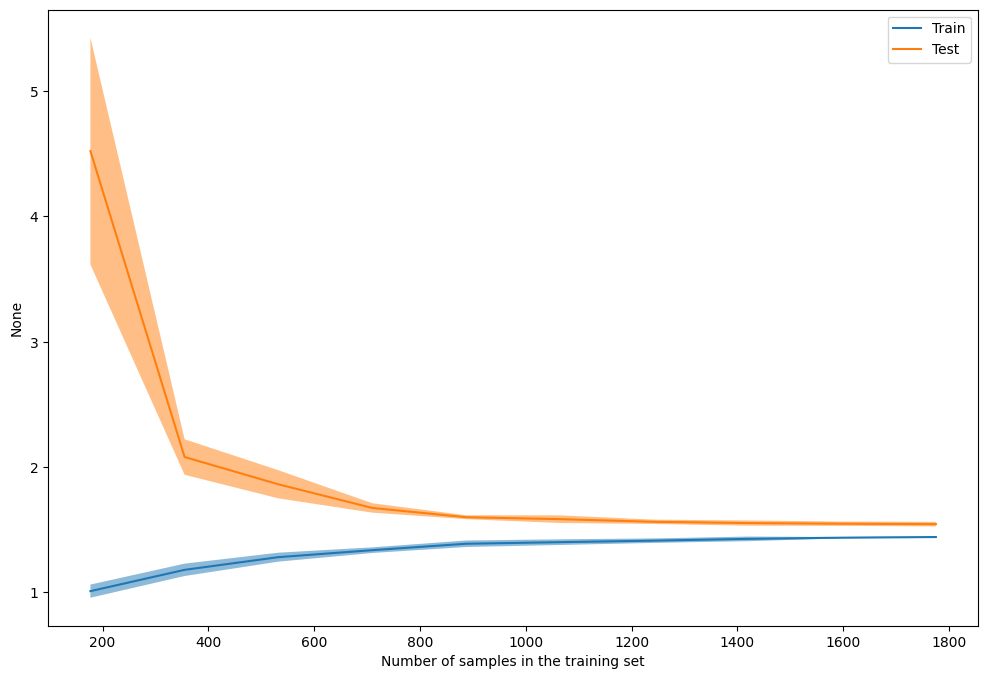

In [23]:
logist_params={
    'penalty':best_params['penalty'],
    'tol':best_params['tol'],
    'max_iter':best_params['max_iter'],
    'C':best_params['C'],
    'solver':best_params['solver']
}

if best_params['penalty']=='l2' or best_params['penalty']=='l1':
        logist_params['l1_ratio']=None
else:
    logist_params['l1_ratio']=best_params['l1_ratio']

if (best_params['penalty']=='l1'):
    logist_params['solver']='saga'
elif best_params['penalty']=='elasticnet':
    logist_params['solver']='saga'
else:
    logist_params['solver']=best_params['solver']

print(best_params)

logistic_final_pipeline=Pipeline(
        [
            ('NewFeatures',NewFeatureCreate()),
            ('Club_weight', ClubWeightadder(columns=['Club_Left'],top_club_weights={'Manchester City': 27,'Real Madrid': 26,'FC Bayern München': 25,'FC Paris Saint-Germain': 24,'Inter Mailand': 23,'FC Barcelona': 22,
                                                'FC Arsenal': 21,'FC Liverpool': 20,'Atlético Madrid': 19,'Borussia Dortmund': 18,'Juventus Turin': 17,'AC Mailand': 16,'Manchester United': 15,'RasenBallsport Leipzig': 14,
                                                'FC Chelsea': 13,'SSC Neapel': 12,'Newcastle United': 11,'Bayer 04 Leverkusen': 10,'AS Monaco': 9,'Olympique Marseille': 8,'Ajax Amsterdam': 7,'FC Porto': 6,'Benfica Lissabon': 5,
                                                'Sporting Lissabon': 4,'Galatasaray': 3,'Fenerbahce': 2,'Tottenham Hotspur': 1},non_top_weight=0.05)),
            ('TopClubs',TopClubTransformer(columns=[('Club_Left','League_Left')])),
            ('League_Weight',LeagueWeightEncoder(top_league_weights={'Premier League': 5,'LaLiga': 4,'Bundesliga': 3,'Serie A': 2,'Ligue 1': 1 },columns=['League_Left'])),
            ('TopLeague',TopLeagueTransformer(['League_Left'])),
            ('Nation Binning',RareLabelEncoder(variables='Nation',tol=best_params['nation_tol'])),
            ('Club_Left Binning', RareLabelEncoder(variables='Club_Left',tol=best_params['club_left_tol'])),
            ##('League_Left Binning', RareLabelEncoder(variables='League_Left',tol=0.001)),
            ('One-Hot Encoder',OneHotEncoder(variables=['Age','Pos'],drop_last=True)),
            ('Position_Score_FW', PositionScore(pos='FW', balanced_classes=True)),
            ('Position_Score_MF', PositionScore(pos='MF', balanced_classes=True)),
            ('Position_Score_DF', PositionScore(pos='DF', balanced_classes=True)),
            ('Position_Score_GK', PositionScore(pos='GK', balanced_classes=True)),
            ('Class Target Encoding',CatBoostEncoder(cols=['Nation','Club_Left','League_Left'],random_state=101)),
            ('Feature Selector Classification',Feature_Selector_Classification(threshold=best_params['feature_select_thresh'], random_state=101)),
            ('Logistic Regression',LogisticRegression(**logist_params,class_weight='balanced',multi_class='multinomial',random_state=101))
        ]
        )

train_sizes,train_scores,val_scores=learning_curve(
    estimator=logistic_final_pipeline,
    X=X_train,
    y=y_train,
    groups=groups_fit,
    train_sizes=np.linspace(0.1,1.0,10),
    cv=cv,
    shuffle=True,
    scoring='neg_log_loss',
    n_jobs=-1,
    random_state=101
)

for train_size, cv_train_scores, cv_val_scores in zip(train_sizes, train_scores, val_scores):
    print(f'Train Size: {np.mean(train_size)} | Train Score: {np.mean(cv_train_scores)*-1} | Val Score: {np.mean(cv_val_scores)*-1}')


fig, ax = plt.subplots(figsize=(12,8))
display_lc=LearningCurveDisplay(
    train_sizes=(train_sizes),
    train_scores=(train_scores)*-1,
    test_scores=(val_scores)*-1
)
display_lc.plot(ax=ax)

### Classification Report Logistic Regression

{'nation_tol': 0.007424549268690043, 'club_left_tol': 0.008431102859340721, 'feature_select_thresh': 0.010365079410961134, 'tol': 0.0003062096220237091, 'max_iter': 193, 'C': 7.270680507817651, 'l1_ratio': 0.5221278552372438, 'penalty': None, 'solver': 'newton-cg'}


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\sklearn\linear_model\_logistic.py:1221: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=None)
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\sklearn\linear_model\_logistic.py:1232: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\sklearn\utils\optimize.py:319: ConvergenceW

Log Loss Score: 1.5077891679982345
Macro F1-Score: 0.34320549523481536
                precision    recall  f1-score   support

    Bundesliga       0.49      0.27      0.35        78
        LaLiga       0.48      0.28      0.35       112
       Ligue 1       0.00      0.00      0.00        71
 Other Leagues       0.36      0.71      0.48       187
Premier League       0.35      0.29      0.32        84
       Serie A       0.59      0.54      0.56       156

      accuracy                           0.43       688
     macro avg       0.38      0.35      0.34       688
  weighted avg       0.41      0.43      0.39       688

Top-1: 0.4273255813953488
Top-3: 0.7703488372093024
Top-5: 0.9491279069767442


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in lab

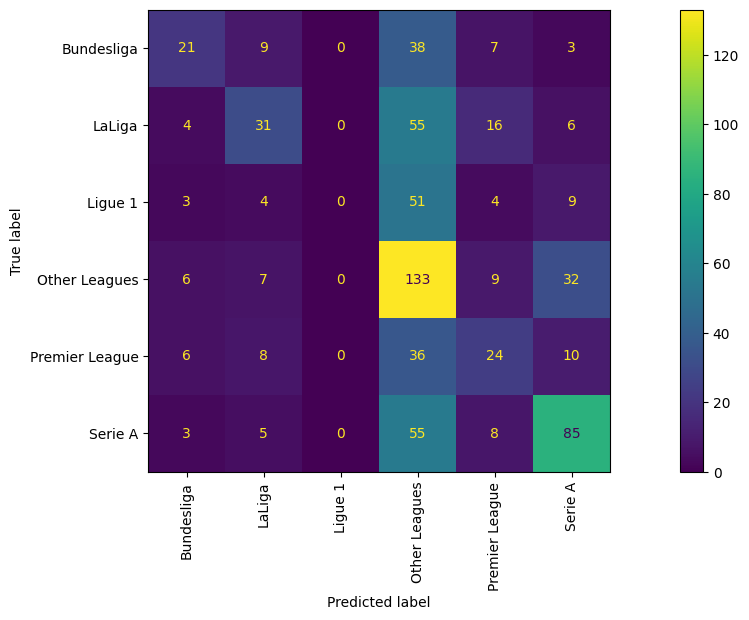

In [24]:
logist_params={
    'penalty':best_params['penalty'],
    'tol':best_params['tol'],
    'max_iter':best_params['max_iter'],
    'C':best_params['C'],
    'solver':best_params['solver']
}

if best_params['penalty']=='l2' or best_params['penalty']=='l1':
        logist_params['l1_ratio']=None
else:
    logist_params['l1_ratio']=best_params['l1_ratio']

if (best_params['penalty']=='l1'):
    logist_params['solver']='saga'
elif best_params['penalty']=='elasticnet':
    logist_params['solver']='saga'
else:
    logist_params['solver']=best_params['solver']

print(best_params)

# --- rebuild the SAME pipeline with tuned preprocessing & model
base_pipeline = Pipeline(
[
        ('NewFeatures',NewFeatureCreate()),
        ('Club_weight', ClubWeightadder(columns=['Club_Left'],top_club_weights={'Manchester City': 27,'Real Madrid': 26,'FC Bayern München': 25,'FC Paris Saint-Germain': 24,'Inter Mailand': 23,'FC Barcelona': 22,
                                            'FC Arsenal': 21,'FC Liverpool': 20,'Atlético Madrid': 19,'Borussia Dortmund': 18,'Juventus Turin': 17,'AC Mailand': 16,'Manchester United': 15,'RasenBallsport Leipzig': 14,
                                            'FC Chelsea': 13,'SSC Neapel': 12,'Newcastle United': 11,'Bayer 04 Leverkusen': 10,'AS Monaco': 9,'Olympique Marseille': 8,'Ajax Amsterdam': 7,'FC Porto': 6,'Benfica Lissabon': 5,
                                            'Sporting Lissabon': 4,'Galatasaray': 3,'Fenerbahce': 2,'Tottenham Hotspur': 1},non_top_weight=0.05)),
        ('TopClubs',TopClubTransformer(columns=[('Club_Left','League_Left')])),
        ('League_Weight',LeagueWeightEncoder(top_league_weights={'Premier League': 5,'LaLiga': 4,'Bundesliga': 3,'Serie A': 2,'Ligue 1': 1 },columns=['League_Left'])),
        ('TopLeague',TopLeagueTransformer(['League_Left'])),
        ('Nation Binning',RareLabelEncoder(variables='Nation',tol=best_params['nation_tol'])),
        ('Club_Left Binning', RareLabelEncoder(variables='Club_Left',tol=best_params['club_left_tol'])),
        ##('League_Left Binning', RareLabelEncoder(variables='League_Left',tol=0.001)),
        ('One-Hot Encoder',OneHotEncoder(variables=['Age','Pos'],drop_last=True)),
        ('Position_Score_FW', PositionScore(pos='FW', balanced_classes=True)),
        ('Position_Score_MF', PositionScore(pos='MF', balanced_classes=True)),
        ('Position_Score_DF', PositionScore(pos='DF', balanced_classes=True)),
        ('Position_Score_GK', PositionScore(pos='GK', balanced_classes=True)),
        ('Class Target Encoding',CatBoostEncoder(cols=['Nation','Club_Left','League_Left'],random_state=101)),
        ('Feature Selector Classification',Feature_Selector_Classification(threshold=best_params['feature_select_thresh'], random_state=101)),
        ('Logistic Regression',LogisticRegression(**logist_params,class_weight='balanced',multi_class='multinomial',random_state=101))
    ]
)

# 1) Fit the BASE pipeline on TRAIN only (this trains the LR too)
base_pipeline.fit(X_train, y_train)

# 2) Wrap the *fitted* pipeline for calibration and fit on CAL set
lgccv = CalibratedClassifierCV(
    estimator=base_pipeline,
    method='sigmoid',   # or 'sigmoid' if cal set is small
    cv='prefit',
    n_jobs=-1
)
lgccv.fit(X_cal, y_cal)

# 3) Final evaluation on TEST
y_proba= lgccv.predict_proba(X_test)
y_pred=lgccv.predict(X_test)

print(f'Log Loss Score: {log_loss(y_test,y_proba,labels=lgccv.classes_)}')

print(f'Macro F1-Score: {f1_score(y_test,y_pred,average="macro",labels=lgccv.classes_)}')

print(classification_report(y_test,y_pred))

cm=confusion_matrix(y_test,y_pred)
fig, ax = plt.subplots(figsize=(18,6))
CM=ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=lgccv.classes_)
CM.plot(ax=ax)
plt.xticks(rotation=90)

# top-1 (normal accuracy)
acc1 = top_k_accuracy_score(y_test, y_proba, k=1,labels=lgccv.classes_)

# top-3
acc3 = top_k_accuracy_score(y_test, y_proba, k=3,labels=lgccv.classes_)

# top-5
acc5 = top_k_accuracy_score(y_test, y_proba, k=5,labels=lgccv.classes_)

print("Top-1:", acc1)
print("Top-3:", acc3)
print("Top-5:", acc5)

In [25]:
performance_dict={
    'Logistic Regression': {'Log Loss':study.best_value,'Macro F1-Score':f1_score(y_test,y_pred,average="macro"),'Run Time in Minutes':round((end_time - start_time)/60,2)}
}
performance_df=pd.DataFrame.from_dict(performance_dict,orient='index')

file_path = r'..\..\Models\Performance\Performance.csv'

save_model_performance(performance_df,file_path)

In [26]:
test=pd.read_csv(file_path)
test

,Unnamed: 0.1,Unnamed: 0,Log Loss,Macro F1-Score,Run Time in Minutes
0,0,Logistic Regression,1.919027,0.297415,27.04
1,Logistic Regression,NaN,1.579359,0.343205,152.19


## Light GBM

c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\_experimental.py:32: ExperimentalWarning: Argument ``multivariate`` is an experimental feature. The interface can change in the future.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\_experimental.py:32: ExperimentalWarning: Argument ``group`` is an experimental feature. The interface can change in the future.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\_experimental.py:32: ExperimentalWarning: Argument ``constant_liar`` is an experimental feature. The interface can change in the future.
  warnings.warn(
[I 2025-09-21 00:37:14,934] A new study created in memory with name: no-name-91ae56c4-b484-4db9-adcb-32a55c1774da
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Li

Training until validation scores don't improve for 250 rounds
Early stopping, best iteration is:
[1]	valid_0's multi_logloss: 1.80637


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Footb

Training until validation scores don't improve for 250 rounds
Early stopping, best iteration is:
[1]	valid_0's multi_logloss: 1.80981


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Footb

Training until validation scores don't improve for 250 rounds
Early stopping, best iteration is:
[1]	valid_0's multi_logloss: 1.80856


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Footb

Training until validation scores don't improve for 250 rounds
Early stopping, best iteration is:
[1]	valid_0's multi_logloss: 1.79354


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Footb

Training until validation scores don't improve for 250 rounds
Early stopping, best iteration is:
[1]	valid_0's multi_logloss: 1.81895
Training until validation scores don't improve for 250 rounds
Early stopping, best iteration is:
[1]	valid_0's multi_logloss: 1.79162


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Footb

Training until validation scores don't improve for 250 rounds
Early stopping, best iteration is:
[1]	valid_0's multi_logloss: 1.79067


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Footb

Training until validation scores don't improve for 250 rounds
Early stopping, best iteration is:
[1]	valid_0's multi_logloss: 1.80005


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Footb

Training until validation scores don't improve for 250 rounds
Early stopping, best iteration is:
[1]	valid_0's multi_logloss: 1.78543


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Footb

Training until validation scores don't improve for 250 rounds
Early stopping, best iteration is:
[1]	valid_0's multi_logloss: 1.78582
Training until validation scores don't improve for 250 rounds
Early stopping, best iteration is:
[700]	valid_0's multi_logloss: 1.46333


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Footb

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Stu

Early stopping, best iteration is:
[353]	valid_0's multi_logloss: 1.59499


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Footb

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Stu

Early stopping, best iteration is:
[566]	valid_0's multi_logloss: 1.49614


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Footb

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 255 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 256 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 257 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 258 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Stu

Early stopping, best iteration is:
[544]	valid_0's multi_logloss: 1.50025


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Footb

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 263 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 264 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 265 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 266 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Stu

Early stopping, best iteration is:
[408]	valid_0's multi_logloss: 1.50448


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optuna allows to call the same distribution with the same name more than once in a trial. When the parameter values are inconsistent optuna only uses the values of the first call and ignores all following. Using these values: {'step': None, 'low': 0.8, 'high': 1.4, 'log': False}
  warnings.warn(
[I 2025-09-21 00:42:42,948] Trial 3 pruned. Trial was pruned at iteration 50.


Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optuna allows to call the same distribution with the same name more than once in a trial. When the parameter values are inconsistent optuna only uses the values of the first call and ignores all following. Using these values: {'step': None, 'low': 0.8, 'high': 1.4, 'log': False}
  warnings.warn(
[I 2025-09-21 00:43:07,824] Trial 4 pruned. Trial was pruned at iteration 50.


Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optuna allows to call the same distribution with the same name more than once in a trial. When the parameter values are inconsistent optuna only uses the values of the first call and ignores all following. Using these values: {'step': None, 'low': 0.8, 'high': 1.4, 'log': False}
  warnings.warn(
[I 2025-09-21 00:43:25,818] Trial 5 pruned. Trial was pruned at iteration 50.


Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optuna allows to call the same distribution with the same name more than once in a trial. When the parameter values are inconsistent optuna only uses the values of the first call and ignores all following. Using these values: {'step': None, 'low': 0.8, 'high': 1.4, 'log': False}
  warnings.warn(
[I 2025-09-21 00:43:42,623] Trial 6 pruned. Trial was pruned at iteration 50.


Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optuna allows to call the same distribution with the same name more than once in a trial. When the parameter values are inconsistent optuna only uses the values of the first call and ignores all following. Using these values: {'step': None, 'low': 0.8, 'high': 1.4, 'log': False}
  warnings.warn(


Training until validation scores don't improve for 250 rounds
Early stopping, best iteration is:
[1101]	valid_0's multi_logloss: 1.43809


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Footb

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Stu

Early stopping, best iteration is:
[822]	valid_0's multi_logloss: 1.52077


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Footb

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Stu

Early stopping, best iteration is:
[644]	valid_0's multi_logloss: 1.44906


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Footb

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Stu

Early stopping, best iteration is:
[543]	valid_0's multi_logloss: 1.47456


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Footb

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Stu

Early stopping, best iteration is:
[520]	valid_0's multi_logloss: 1.44687


[I 2025-09-21 00:45:29,466] Trial 7 finished with value: 1.4662791828302517 and parameters: {'nation_tol': 0.006631961059295376, 'club_left_tol': 0.0019076465666507292, 'feature_select_thresh': 0.006071163428890381, 'num_leaves': 45, 'max_depth': 5, 'min_data_in_leaf': 333, 'learning_rate': 0.0432551080431979, 'min_split_gain': 0.05480940499002902, 'min_child_weight': 10.563300573913605, 'subsample': 0.8410536950922165, 'subsample_freq': 2, 'colsample_bytree': 0.7121776421963079, 'reg_alpha': 0.0015206828379588136, 'reg_lambda': 219.7451008631527, 'boost_Bundesliga': 0.9658527324435746, 'boost_LaLiga': 1.1485546407226008, 'boost_Ligue 1': 1.3463973576095207, 'boost_Other Leagues': 1.3955546278753568, 'boost_Premier League': 0.8373344237851635, 'boost_Serie A': 1.357088862559835}. Best is trial 7 with value: 1.4662791828302517.
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsiste

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optuna allows to call the same distribution with the same name more than once in a trial. When the parameter values are inconsistent optuna only uses the values of the first call and ignores all following. Using these values: {'step': None, 'low': 0.8, 'high': 1.4, 'log': False}
  warnings.warn(
[I 2025-09-21 00:46:17,510] Trial 9 pruned. Trial was pruned at iteration 50.


Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optuna allows to call the same distribution with the same name more than once in a trial. When the parameter values are inconsistent optuna only uses the values of the first call and ignores all following. Using these values: {'step': None, 'low': 0.8, 'high': 1.4, 'log': False}
  warnings.warn(
[I 2025-09-21 00:46:34,791] Trial 10 pruned. Trial was pruned at iteration 50.


Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optuna allows to call the same distribution with the same name more than once in a trial. When the parameter values are inconsistent optuna only uses the values of the first call and ignores all following. Using these values: {'step': None, 'low': 0.8, 'high': 1.4, 'log': False}
  warnings.warn(
[I 2025-09-21 00:46:51,390] Trial 11 pruned. Trial was pruned at iteration 50.


Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optuna allows to call the same distribution with the same name more than once in a trial. When the parameter values are inconsistent optuna only uses the values of the first call and ignores all following. Using these values: {'step': None, 'low': 0.8, 'high': 1.4, 'log': False}
  warnings.warn(
[I 2025-09-21 00:47:09,968] Trial 12 pruned. Trial was pruned at iteration 50.


Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optuna allows to call the same distribution with the same name more than once in a trial. When the parameter values are inconsistent optuna only uses the values of the first call and ignores all following. Using these values: {'step': None, 'low': 0.8, 'high': 1.4, 'log': False}
  warnings.warn(
[I 2025-09-21 00:47:32,700] Trial 13 pruned. Trial was pruned at iteration 50.


Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optuna allows to call the same distribution with the same name more than once in a trial. When the parameter values are inconsistent optuna only uses the values of the first call and ignores all following. Using these values: {'step': None, 'low': 0.8, 'high': 1.4, 'log': False}
  warnings.warn(
[I 2025-09-21 00:47:58,824] Trial 14 pruned. Trial was pruned at iteration 50.


Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optuna allows to call the same distribution with the same name more than once in a trial. When the parameter values are inconsistent optuna only uses the values of the first call and ignores all following. Using these values: {'step': None, 'low': 0.8, 'high': 1.4, 'log': False}
  warnings.warn(
[I 2025-09-21 00:48:17,310] Trial 15 pruned. Trial was pruned at iteration 150.


Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optuna allows to call the same distribution with the same name more than once in a trial. When the parameter values are inconsistent optuna only uses the values of the first call and ignores all following. Using these values: {'step': None, 'low': 0.8, 'high': 1.4, 'log': False}
  warnings.warn(
[I 2025-09-21 00:48:33,525] Trial 16 pruned. Trial was pruned at iteration 50.


Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optuna allows to call the same distribution with the same name more than once in a trial. When the parameter values are inconsistent optuna only uses the values of the first call and ignores all following. Using these values: {'step': None, 'low': 0.8, 'high': 1.4, 'log': False}
  warnings.warn(
[I 2025-09-21 00:48:51,374] Trial 17 pruned. Trial was pruned at iteration 150.


Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optuna allows to call the same distribution with the same name more than once in a trial. When the parameter values are inconsistent optuna only uses the values of the first call and ignores all following. Using these values: {'step': None, 'low': 0.8, 'high': 1.4, 'log': False}
  warnings.warn(


Training until validation scores don't improve for 250 rounds


[I 2025-09-21 00:49:13,324] Trial 18 pruned. Trial was pruned at iteration 450.
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optuna allows to call the same distribution with the same name more than once in a trial. When the parameter values are inconsistent optuna only uses the values of the first call and ignores all following. Using these values: {'step': None, 'low': 0.8, 'high': 1.4, 'log': False}
  warnings.warn(
[I 2025-09-21 00:49:38,565] Trial 19 pruned. Trial was pruned at iteration 50.


Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optuna allows to call the same distribution with the same name more than once in a trial. When the parameter values are inconsistent optuna only uses the values of the first call and ignores all following. Using these values: {'step': None, 'low': 0.8, 'high': 1.4, 'log': False}
  warnings.warn(


Training until validation scores don't improve for 250 rounds


[I 2025-09-21 00:49:59,850] Trial 20 pruned. Trial was pruned at iteration 450.
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optuna allows to call the same distribution with the same name more than once in a trial. When the parameter values are inconsistent optuna only uses the values of the first call and ignores all following. Using these values: {'step': None, 'low': 0.8, 'high': 1.4, 'log': False}
  warnings.warn(
[I 2025-09-21 00:50:16,460] Trial 21 pruned. Trial was pruned at iteration 50.


Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optuna allows to call the same distribution with the same name more than once in a trial. When the parameter values are inconsistent optuna only uses the values of the first call and ignores all following. Using these values: {'step': None, 'low': 0.8, 'high': 1.4, 'log': False}
  warnings.warn(
[I 2025-09-21 00:50:33,821] Trial 22 pruned. Trial was pruned at iteration 50.


Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optuna allows to call the same distribution with the same name more than once in a trial. When the parameter values are inconsistent optuna only uses the values of the first call and ignores all following. Using these values: {'step': None, 'low': 0.8, 'high': 1.4, 'log': False}
  warnings.warn(
[I 2025-09-21 00:50:53,831] Trial 23 pruned. Trial was pruned at iteration 50.


Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optuna allows to call the same distribution with the same name more than once in a trial. When the parameter values are inconsistent optuna only uses the values of the first call and ignores all following. Using these values: {'step': None, 'low': 0.8, 'high': 1.4, 'log': False}
  warnings.warn(
[I 2025-09-21 00:51:19,388] Trial 24 pruned. Trial was pruned at iteration 50.


Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optuna allows to call the same distribution with the same name more than once in a trial. When the parameter values are inconsistent optuna only uses the values of the first call and ignores all following. Using these values: {'step': None, 'low': 0.8, 'high': 1.4, 'log': False}
  warnings.warn(
[I 2025-09-21 00:51:40,277] Trial 25 pruned. Trial was pruned at iteration 150.


Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optuna allows to call the same distribution with the same name more than once in a trial. When the parameter values are inconsistent optuna only uses the values of the first call and ignores all following. Using these values: {'step': None, 'low': 0.8, 'high': 1.4, 'log': False}
  warnings.warn(
[I 2025-09-21 00:51:57,398] Trial 26 pruned. Trial was pruned at iteration 150.


Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optuna allows to call the same distribution with the same name more than once in a trial. When the parameter values are inconsistent optuna only uses the values of the first call and ignores all following. Using these values: {'step': None, 'low': 0.8, 'high': 1.4, 'log': False}
  warnings.warn(


Training until validation scores don't improve for 250 rounds
Early stopping, best iteration is:
[835]	valid_0's multi_logloss: 1.43564


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Footb

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Stu

Early stopping, best iteration is:
[502]	valid_0's multi_logloss: 1.51395


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Footb

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Stu

Early stopping, best iteration is:
[457]	valid_0's multi_logloss: 1.45092


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Footb

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Stu

Early stopping, best iteration is:
[491]	valid_0's multi_logloss: 1.46366


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Footb

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Stu

Early stopping, best iteration is:
[446]	valid_0's multi_logloss: 1.44743


[I 2025-09-21 00:53:42,517] Trial 27 finished with value: 1.4627689997024014 and parameters: {'nation_tol': 0.007981578455634946, 'club_left_tol': 0.0015661260295839817, 'feature_select_thresh': 0.0034639078716125985, 'num_leaves': 43, 'max_depth': 5, 'min_data_in_leaf': 301, 'learning_rate': 0.03139368909971172, 'min_split_gain': 0.09637403363024416, 'min_child_weight': 15.379469362715518, 'subsample': 0.8236928400254986, 'subsample_freq': 1, 'colsample_bytree': 0.7327595348747189, 'reg_alpha': 0.0016711734479596173, 'reg_lambda': 139.9108238295664, 'boost_Bundesliga': 0.9339242381510826, 'boost_LaLiga': 1.139406526692321, 'boost_Ligue 1': 1.3136877332807253, 'boost_Other Leagues': 1.356281234253061, 'boost_Premier League': 0.8828625615451224, 'boost_Serie A': 1.2964815540141232}. Best is trial 27 with value: 1.4627689997024014.
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsi

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optuna allows to call the same distribution with the same name more than once in a trial. When the parameter values are inconsistent optuna only uses the values of the first call and ignores all following. Using these values: {'step': None, 'low': 0.8, 'high': 1.4, 'log': False}
  warnings.warn(


Training until validation scores don't improve for 250 rounds


[I 2025-09-21 00:54:30,647] Trial 29 pruned. Trial was pruned at iteration 450.
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optuna allows to call the same distribution with the same name more than once in a trial. When the parameter values are inconsistent optuna only uses the values of the first call and ignores all following. Using these values: {'step': None, 'low': 0.8, 'high': 1.4, 'log': False}
  warnings.warn(


Training until validation scores don't improve for 250 rounds
Early stopping, best iteration is:
[554]	valid_0's multi_logloss: 1.43533


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Footb

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Stu

Early stopping, best iteration is:
[295]	valid_0's multi_logloss: 1.51052


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Footb

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Stu

Early stopping, best iteration is:
[332]	valid_0's multi_logloss: 1.44233


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Footb

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\F

Early stopping, best iteration is:
[241]	valid_0's multi_logloss: 1.46801


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Footb

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Stu

Early stopping, best iteration is:
[275]	valid_0's multi_logloss: 1.45993


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optuna allows to call the same distribution with the same name more than once in a trial. When the parameter values are inconsistent optuna only uses the values of the first call and ignores all following. Using these values: {'step': None, 'low': 0.8, 'high': 1.4, 'log': False}
  warnings.warn(
[I 2025-09-21 00:56:31,753] Trial 31 pruned. Trial was pruned at iteration 150.


Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optuna allows to call the same distribution with the same name more than once in a trial. When the parameter values are inconsistent optuna only uses the values of the first call and ignores all following. Using these values: {'step': None, 'low': 0.8, 'high': 1.4, 'log': False}
  warnings.warn(


Training until validation scores don't improve for 250 rounds


[I 2025-09-21 00:56:50,537] Trial 32 pruned. Trial was pruned at iteration 450.
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optuna allows to call the same distribution with the same name more than once in a trial. When the parameter values are inconsistent optuna only uses the values of the first call and ignores all following. Using these values: {'step': None, 'low': 0.8, 'high': 1.4, 'log': False}
  warnings.warn(


Training until validation scores don't improve for 250 rounds


[I 2025-09-21 00:57:11,697] Trial 33 pruned. Trial was pruned at iteration 150.
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optuna allows to call the same distribution with the same name more than once in a trial. When the parameter values are inconsistent optuna only uses the values of the first call and ignores all following. Using these values: {'step': None, 'low': 0.8, 'high': 1.4, 'log': False}
  warnings.warn(


Training until validation scores don't improve for 250 rounds
Early stopping, best iteration is:
[645]	valid_0's multi_logloss: 1.43645


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Footb

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Stu

Early stopping, best iteration is:
[363]	valid_0's multi_logloss: 1.51112


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Footb

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Stu

Early stopping, best iteration is:
[387]	valid_0's multi_logloss: 1.45001


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Footb

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Stu

Early stopping, best iteration is:
[346]	valid_0's multi_logloss: 1.46486


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Footb

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Stu

Early stopping, best iteration is:
[315]	valid_0's multi_logloss: 1.45165


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optuna allows to call the same distribution with the same name more than once in a trial. When the parameter values are inconsistent optuna only uses the values of the first call and ignores all following. Using these values: {'step': None, 'low': 0.8, 'high': 1.4, 'log': False}
  warnings.warn(


Training until validation scores don't improve for 250 rounds
Early stopping, best iteration is:
[553]	valid_0's multi_logloss: 1.43927


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Footb

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Stu

Early stopping, best iteration is:
[299]	valid_0's multi_logloss: 1.51582


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Footb

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Stu

Early stopping, best iteration is:
[234]	valid_0's multi_logloss: 1.44457


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Footb

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Stu

Early stopping, best iteration is:
[233]	valid_0's multi_logloss: 1.47219


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Footb

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Stu

Early stopping, best iteration is:
[242]	valid_0's multi_logloss: 1.454


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optuna allows to call the same distribution with the same name more than once in a trial. When the parameter values are inconsistent optuna only uses the values of the first call and ignores all following. Using these values: {'step': None, 'low': 0.8, 'high': 1.4, 'log': False}
  warnings.warn(


Training until validation scores don't improve for 250 rounds


[I 2025-09-21 01:01:07,843] Trial 36 pruned. Trial was pruned at iteration 450.
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optuna allows to call the same distribution with the same name more than once in a trial. When the parameter values are inconsistent optuna only uses the values of the first call and ignores all following. Using these values: {'step': None, 'low': 0.8, 'high': 1.4, 'log': False}
  warnings.warn(
[I 2025-09-21 01:01:29,589] Trial 37 pruned. Trial was pruned at iteration 50.


Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optuna allows to call the same distribution with the same name more than once in a trial. When the parameter values are inconsistent optuna only uses the values of the first call and ignores all following. Using these values: {'step': None, 'low': 0.8, 'high': 1.4, 'log': False}
  warnings.warn(
[I 2025-09-21 01:01:46,224] Trial 38 pruned. Trial was pruned at iteration 150.


Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optuna allows to call the same distribution with the same name more than once in a trial. When the parameter values are inconsistent optuna only uses the values of the first call and ignores all following. Using these values: {'step': None, 'low': 0.8, 'high': 1.4, 'log': False}
  warnings.warn(


Training until validation scores don't improve for 250 rounds
Early stopping, best iteration is:
[1190]	valid_0's multi_logloss: 1.4318


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Footb

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Stu

Early stopping, best iteration is:
[491]	valid_0's multi_logloss: 1.52066


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Footb

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Stu

Early stopping, best iteration is:
[495]	valid_0's multi_logloss: 1.44421


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Footb

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Stu

Early stopping, best iteration is:
[561]	valid_0's multi_logloss: 1.45983


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Footb

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Stu

Early stopping, best iteration is:
[394]	valid_0's multi_logloss: 1.44948
Best Params: {'nation_tol': 0.007181553038479678, 'club_left_tol': 0.005658263408383936, 'feature_select_thresh': 0.0022710073497189424, 'num_leaves': 43, 'max_depth': 5, 'min_data_in_leaf': 355, 'learning_rate': 0.0313703689967097, 'min_split_gain': 0.14596595906987633, 'min_child_weight': 36.22380379312269, 'subsample': 0.883975878580748, 'subsample_freq': 1, 'colsample_bytree': 0.6996277937025872, 'reg_alpha': 0.002591164181762543, 'reg_lambda': 122.54341890732059, 'boost_Bundesliga': 0.9592891786200193, 'boost_LaLiga': 1.0634092625258935, 'boost_Ligue 1': 1.3531922177839704, 'boost_Other Leagues': 1.385163896263853, 'boost_Premier League': 0.9931743149409186, 'boost_Serie A': 1.3265081111608983, 'n_estimators': 626}
Best Score: 1.4616322070026369
Run Time: 26.30 Minutes


C:\Users\gandj\AppData\Local\Temp\ipykernel_22768\826395869.py:123: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  optuna_matplotlib.plot_optimization_history(study_first_run)


<Figure size 1000x600 with 0 Axes>

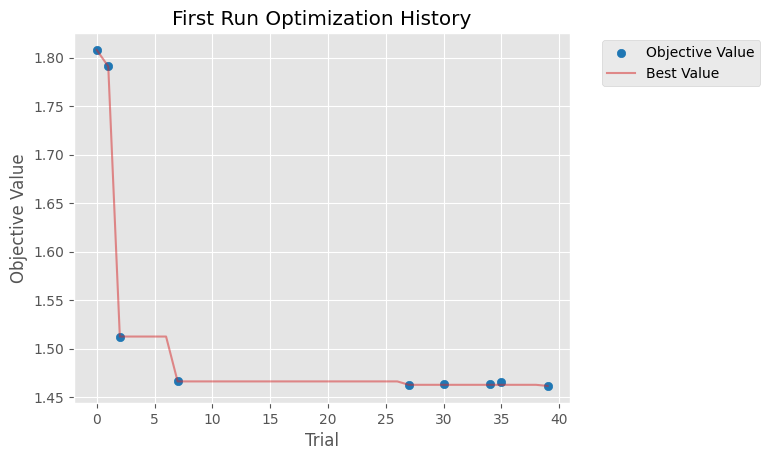

C:\Users\gandj\AppData\Local\Temp\ipykernel_22768\826395869.py:127: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  optuna_matplotlib.plot_param_importances(study_first_run)


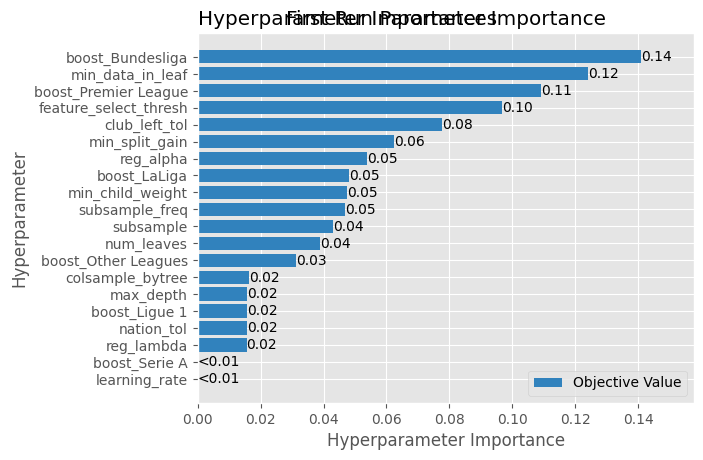

c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\_experimental.py:32: ExperimentalWarning: Argument ``multivariate`` is an experimental feature. The interface can change in the future.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\_experimental.py:32: ExperimentalWarning: Argument ``group`` is an experimental feature. The interface can change in the future.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\_experimental.py:32: ExperimentalWarning: Argument ``constant_liar`` is an experimental feature. The interface can change in the future.
  warnings.warn(
[I 2025-09-21 01:03:33,582] A new study created in memory with name: no-name-53df983d-7cfe-4e95-bb38-d7b033388f27
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Li

Training until validation scores don't improve for 250 rounds
Training until validation scores don't improve for 250 rounds
Training until validation scores don't improve for 250 rounds
Training until validation scores don't improve for 250 rounds
Training until validation scores don't improve for 250 rounds
Training until validation scores don't improve for 250 rounds
Training until validation scores don't improve for 250 rounds
Training until validation scores don't improve for 250 rounds
Training until validation scores don't improve for 250 rounds
Training until validation scores don't improve for 250 rounds


[I 2025-09-21 01:07:20,802] Trial 9 pruned. Trial was pruned at iteration 50.
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optuna allows to call the same distribution with the same name more than once in a trial. When the parameter values are inconsistent optuna only uses the values of the first call and ignores all following. Using these values: {'step': None, 'low': 0.8, 'high': 1.4, 'log': False}
  warnings.warn(
[I 2025-09-21 01:07:21,397] Trial 7 pruned. Trial was pruned at iteration 50.
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optuna 

Training until validation scores don't improve for 250 rounds


[I 2025-09-21 01:07:26,320] Trial 5 pruned. Trial was pruned at iteration 150.
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optuna allows to call the same distribution with the same name more than once in a trial. When the parameter values are inconsistent optuna only uses the values of the first call and ignores all following. Using these values: {'step': None, 'low': 0.8, 'high': 1.4, 'log': False}
  warnings.warn(


Training until validation scores don't improve for 250 rounds


[I 2025-09-21 01:07:27,603] Trial 6 pruned. Trial was pruned at iteration 150.
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optuna allows to call the same distribution with the same name more than once in a trial. When the parameter values are inconsistent optuna only uses the values of the first call and ignores all following. Using these values: {'step': None, 'low': 0.8, 'high': 1.4, 'log': False}
  warnings.warn(
[I 2025-09-21 01:07:29,203] Trial 8 pruned. Trial was pruned at iteration 150.
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optun

Did not meet early stopping. Best iteration is:
[536]	valid_0's multi_logloss: 1.47727


[I 2025-09-21 01:07:47,696] Trial 2 pruned. Trial was pruned at iteration 450.
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optuna allows to call the same distribution with the same name more than once in a trial. When the parameter values are inconsistent optuna only uses the values of the first call and ignores all following. Using these values: {'step': None, 'low': 0.8, 'high': 1.4, 'log': False}
  warnings.warn(
[I 2025-09-21 01:07:47,993] Trial 4 pruned. Trial was pruned at iteration 450.
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optun

Did not meet early stopping. Best iteration is:
[670]	valid_0's multi_logloss: 1.44593
Training until validation scores don't improve for 250 rounds
Training until validation scores don't improve for 250 rounds


[I 2025-09-21 01:11:10,190] Trial 19 pruned. Trial was pruned at iteration 50.
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optuna allows to call the same distribution with the same name more than once in a trial. When the parameter values are inconsistent optuna only uses the values of the first call and ignores all following. Using these values: {'step': None, 'low': 0.8, 'high': 1.4, 'log': False}
  warnings.warn(
[I 2025-09-21 01:11:11,022] Trial 14 pruned. Trial was pruned at iteration 150.
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optu

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Footb

Training until validation scores don't improve for 250 rounds
Training until validation scores don't improve for 250 rounds
Training until validation scores don't improve for 250 rounds
Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 260 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 261 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 262 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 263 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Stu

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 278 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 279 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 280 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 281 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Stu

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 301 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 302 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 303 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 304 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Stu

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 450 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 451 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\F

Did not meet early stopping. Best iteration is:
[500]	valid_0's multi_logloss: 1.58823


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\F

Training until validation scores don't improve for 250 rounds
Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 364 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 365 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 366 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 367 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Stu

Early stopping, best iteration is:
[357]	valid_0's multi_logloss: 1.54086
Early stopping, best iteration is:
[467]	valid_0's multi_logloss: 1.42875
Did not meet early stopping. Best iteration is:
[585]	valid_0's multi_logloss: 1.43095
Training until validation scores don't improve for 250 rounds
Training until validation scores don't improve for 250 rounds


[I 2025-09-21 01:14:52,158] Trial 23 pruned. Trial was pruned at iteration 50.
[I 2025-09-21 01:14:52,229] Trial 22 pruned. Trial was pruned at iteration 50.
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optuna allows to call the same distribution with the same name more than once in a trial. When the parameter values are inconsistent optuna only uses the values of the first call and ignores all following. Using these values: {'step': None, 'low': 0.8, 'high': 1.4, 'log': False}
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optun

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\F

Training until validation scores don't improve for 250 rounds
Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 529 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 530 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 531 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study

Training until validation scores don't improve for 250 roundsTraining until validation scores don't improve for 250 rounds

Did not meet early stopping. Best iteration is:
[428]	valid_0's multi_logloss: 1.49337


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Foo

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optuna allows to call the same distribution with the same name more than once in a trial. When the parameter values are inconsistent optuna only uses the values of the first call and ignores all following. Using these values: {'step': None, 'low': 0.8,

Training until validation scores don't improve for 250 rounds
Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 529 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 530 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 531 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 532 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Stu

Did not meet early stopping. Best iteration is:
[464]	valid_0's multi_logloss: 1.47705


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Footb

Training until validation scores don't improve for 250 rounds
Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Footb

Early stopping, best iteration is:
[369]	valid_0's multi_logloss: 1.51421


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 659 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 660 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 661 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 662 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Stu

Early stopping, best iteration is:
[416]	valid_0's multi_logloss: 1.51927
Training until validation scores don't improve for 250 rounds
Training until validation scores don't improve for 250 rounds


[I 2025-09-21 01:18:23,678] Trial 31 pruned. Trial was pruned at iteration 150.
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optuna allows to call the same distribution with the same name more than once in a trial. When the parameter values are inconsistent optuna only uses the values of the first call and ignores all following. Using these values: {'step': None, 'low': 0.8, 'high': 1.4, 'log': False}
  warnings.warn(
[I 2025-09-21 01:18:31,969] Trial 30 pruned. Trial was pruned at iteration 450.
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Opt

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\F

Did not meet early stopping. Best iteration is:
[536]	valid_0's multi_logloss: 1.49749


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(


Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Footb

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\F

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Stu

Training until validation scores don't improve for 250 roundsTraining until validation scores don't improve for 250 rounds



c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 281 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 282 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 283 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 284 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Stu

Did not meet early stopping. Best iteration is:
[463]	valid_0's multi_logloss: 1.44103
Training until validation scores don't improve for 250 rounds


[I 2025-09-21 01:20:20,057] Trial 36 pruned. Trial was pruned at iteration 50.
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optuna allows to call the same distribution with the same name more than once in a trial. When the parameter values are inconsistent optuna only uses the values of the first call and ignores all following. Using these values: {'step': None, 'low': 0.8, 'high': 1.4, 'log': False}
  warnings.warn(


Did not meet early stopping. Best iteration is:
[681]	valid_0's multi_logloss: 1.41361
Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(


Training until validation scores don't improve for 250 rounds
Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Footb

Early stopping, best iteration is:
[337]	valid_0's multi_logloss: 1.43584


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 530 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 531 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 532 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 533 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Stu

Early stopping, best iteration is:
[386]	valid_0's multi_logloss: 1.44337
Training until validation scores don't improve for 250 rounds


[I 2025-09-21 01:21:44,221] Trial 38 pruned. Trial was pruned at iteration 150.
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optuna allows to call the same distribution with the same name more than once in a trial. When the parameter values are inconsistent optuna only uses the values of the first call and ignores all following. Using these values: {'step': None, 'low': 0.8, 'high': 1.4, 'log': False}
  warnings.warn(


Training until validation scores don't improve for 250 rounds


[I 2025-09-21 01:22:08,646] Trial 39 pruned. Trial was pruned at iteration 150.
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optuna allows to call the same distribution with the same name more than once in a trial. When the parameter values are inconsistent optuna only uses the values of the first call and ignores all following. Using these values: {'step': None, 'low': 0.8, 'high': 1.4, 'log': False}
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\t

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Fo

Did not meet early stopping. Best iteration is:
[461]	valid_0's multi_logloss: 1.51211


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optuna allows to call the same distribution with the same name more than once in a trial. When the parameter values are inconsistent optuna only uses the values of the first call and ignores all following. Using these values: {'step': None, 'low': 0.8, 'high': 1.4, 'log': False}
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `ste

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\F

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Stu

Training until validation scores don't improve for 250 rounds
Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 261 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 262 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 263 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 264 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Stu

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 558 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 559 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 560 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 561 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Stu

Did not meet early stopping. Best iteration is:
[434]	valid_0's multi_logloss: 1.46031


[I 2025-09-21 01:24:22,275] Trial 11 finished with value: 1.4739619504703878 and parameters: {'nation_tol': 0.006170432441340927, 'club_left_tol': 0.004676775969638413, 'feature_select_thresh': 0.0021397649444192157, 'num_leaves': 38, 'max_depth': 5, 'min_data_in_leaf': 442, 'learning_rate': 0.03542229579569593, 'n_estimators': 674, 'min_split_gain': 0.18325043490129272, 'min_child_weight': 39.83520203261396, 'subsample': 1.1067289147608979, 'subsample_freq': 1, 'colsample_bytree': 0.6003412061531296, 'reg_alpha': 0.002270744258288338, 'reg_lambda': 108.78959208857287, 'boost_Bundesliga': 1.265220166171842, 'boost_LaLiga': 0.8995947884545883, 'boost_Ligue 1': 0.8114995817464362, 'boost_Other Leagues': 1.0643633862468849, 'boost_Premier League': 0.9242667518200754, 'boost_Serie A': 1.212098391480151}. Best is trial 11 with value: 1.4739619504703878.
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: Runt

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Footb

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 564 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 565 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 566 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 567 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Stu

Did not meet early stopping. Best iteration is:
[517]	valid_0's multi_logloss: 1.52012


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Footb

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Footb

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\F

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\F

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study

Did not meet early stopping. Best iteration is:
[654]	valid_0's multi_logloss: 1.43508


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 333 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 334 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Stu

Early stopping, best iteration is:
[352]	valid_0's multi_logloss: 1.46244


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 414 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 415 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 416 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 417 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Stu

Early stopping, best iteration is:
[371]	valid_0's multi_logloss: 1.45291
Training until validation scores don't improve for 250 rounds


[I 2025-09-21 01:26:38,918] Trial 47 pruned. Trial was pruned at iteration 50.
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optuna allows to call the same distribution with the same name more than once in a trial. When the parameter values are inconsistent optuna only uses the values of the first call and ignores all following. Using these values: {'step': None, 'low': 0.8, 'high': 1.4, 'log': False}
  warnings.warn(


Training until validation scores don't improve for 250 rounds


[I 2025-09-21 01:27:48,853] Trial 50 pruned. Trial was pruned at iteration 50.
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optuna allows to call the same distribution with the same name more than once in a trial. When the parameter values are inconsistent optuna only uses the values of the first call and ignores all following. Using these values: {'step': None, 'low': 0.8, 'high': 1.4, 'log': False}
  warnings.warn(


Training until validation scores don't improve for 250 rounds


[I 2025-09-21 01:27:58,499] Trial 48 pruned. Trial was pruned at iteration 50.


Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optuna allows to call the same distribution with the same name more than once in a trial. When the parameter values are inconsistent optuna only uses the values of the first call and ignores all following. Using these values: {'step': None, 'low': 0.8, 'high': 1.4, 'log': False}
  warnings.warn(
[I 2025-09-21 01:28:00,332] Trial 49 pruned. Trial was pruned at iteration 50.
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optuna allows to call the same distribution with the same name more than once in a t

Training until validation scores don't improve for 250 rounds


[I 2025-09-21 01:28:28,136] Trial 51 pruned. Trial was pruned at iteration 50.
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:682: RuntimeWarning: Inconsistent parameter values for distribution with name "boost_Other Leagues"! This might be a configuration mistake. Optuna allows to call the same distribution with the same name more than once in a trial. When the parameter values are inconsistent optuna only uses the values of the first call and ignores all following. Using these values: {'step': None, 'low': 0.8, 'high': 1.4, 'log': False}
  warnings.warn(


Training until validation scores don't improve for 250 rounds
Training until validation scores don't improve for 250 rounds


[I 2025-09-21 01:28:59,598] Trial 53 pruned. Trial was pruned at iteration 50.
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(


Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Footb

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Stu

Did not meet early stopping. Best iteration is:
[586]	valid_0's multi_logloss: 1.43494


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 226 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Stu

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 473 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 474 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\F

Did not meet early stopping. Best iteration is:
[474]	valid_0's multi_logloss: 1.44118


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Stu

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 367 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 368 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 503 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 504 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Stu

Early stopping, best iteration is:
[297]	valid_0's multi_logloss: 1.53888


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Stu

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 307 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 308 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\F

Early stopping, best iteration is:
[357]	valid_0's multi_logloss: 1.45931


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 278 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 279 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 280 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 281 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Stu

Early stopping, best iteration is:
[297]	valid_0's multi_logloss: 1.46376


[I 2025-09-21 01:30:26,035] Trial 15 finished with value: 1.4611883737328288 and parameters: {'nation_tol': 0.0051673119264188955, 'club_left_tol': 0.007052474790361457, 'feature_select_thresh': 0.0029432060869338215, 'num_leaves': 52, 'max_depth': 4, 'min_data_in_leaf': 345, 'learning_rate': 0.03635253406500015, 'n_estimators': 777, 'min_split_gain': 0.1865101800980783, 'min_child_weight': 25.508235048804774, 'subsample': 1.1050313100572189, 'subsample_freq': 1, 'colsample_bytree': 0.5050753639770839, 'reg_alpha': 0.003161371757177738, 'reg_lambda': 117.44359153875294, 'boost_Bundesliga': 1.0091102436749921, 'boost_LaLiga': 0.8647729488744156, 'boost_Ligue 1': 0.9356893904423165, 'boost_Other Leagues': 1.172643443214255, 'boost_Premier League': 1.2166194921801634, 'boost_Serie A': 1.3513695226145948}. Best is trial 15 with value: 1.4611883737328288.


Training until validation scores don't improve for 250 rounds
Did not meet early stopping. Best iteration is:
[568]	valid_0's multi_logloss: 1.42675
Training until validation scores don't improve for 250 rounds
Training until validation scores don't improve for 250 rounds


[I 2025-09-21 01:31:17,904] Trial 57 pruned. Trial was pruned at iteration 150.
[I 2025-09-21 01:31:28,601] Trial 58 pruned. Trial was pruned at iteration 450.


Training until validation scores don't improve for 250 rounds


[I 2025-09-21 01:31:39,156] Trial 59 pruned. Trial was pruned at iteration 450.
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 3 is alr

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\F

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 379 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 380 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study

Early stopping, best iteration is:
[283]	valid_0's multi_logloss: 1.52884


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Stu

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 377 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 378 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study

Early stopping, best iteration is:
[403]	valid_0's multi_logloss: 1.45076


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 311 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 312 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 313 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 314 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Stu

Early stopping, best iteration is:
[316]	valid_0's multi_logloss: 1.45274


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Footb

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\F

Early stopping, best iteration is:
[284]	valid_0's multi_logloss: 1.51538


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Footb

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\F

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 400 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 401 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\

Did not meet early stopping. Best iteration is:
[386]	valid_0's multi_logloss: 1.45272


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Stu

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 360 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 361 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study

Did not meet early stopping. Best iteration is:
[456]	valid_0's multi_logloss: 1.44863


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 368 is already reported.
  warnings.warn(
[I 2025-09-21 01:33:33,722] Trial 32 finished with value: 1.4555518584200378 and parameters: {'nation_tol': 0.005914441331811886, 'club_left_tol': 0.007225620015954129, 'feature_select_thresh': 0.0021712168777540206, 'num_leaves': 41, 'max_depth': 4, 'min_data_in_leaf': 318, 'learning_rate': 0.030768811756486256, 'n_estimators': 698, 'min_split_gain': 0.11973826569379543, 'min_child_weight': 32.173839229855275, 'subsample': 0.8952842691481087, 'subsample_freq': 1, 'colsample_bytree': 0.6058522913455117, 'reg_alpha': 0.0032985112524320666, 'reg_lambda': 92.58826305658219, 'boost_Bundesliga': 0.9420899933154842, 'boost_LaLiga': 0.8623117500348244, 'boost_Ligue 1': 0.9470009501880006, 'boost_Other Leagues': 1.3783283187114146, 'boost_Premier League': 1.

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 433 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 434 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\F

Early stopping, best iteration is:
[260]	valid_0's multi_logloss: 1.47842


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Stu

Early stopping, best iteration is:
[342]	valid_0's multi_logloss: 1.45088
Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Footb

Early stopping, best iteration is:
[341]	valid_0's multi_logloss: 1.47119


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Footb

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\F

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\F

Early stopping, best iteration is:
[275]	valid_0's multi_logloss: 1.45599
Early stopping, best iteration is:
[277]	valid_0's multi_logloss: 1.46063


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 515 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 516 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 517 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 518 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Stu

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\F

Training until validation scores don't improve for 250 rounds


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\F

Did not meet early stopping. Best iteration is:
[381]	valid_0's multi_logloss: 1.46222


c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 519 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 520 is already reported.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\trial\_trial.py:501: UserWarning: The reported value is ignored because this `step` 521 is already reported.
  warnings.warn(
[I 2025-09-21 01:35:28,301] Trial 52 finished with value: 1.4704060808744481 and parameters: {'nation_tol': 0.008310655644500526, 'club_left_tol': 0.004099783247892148, 'feature_select_thresh': 0.0019025422053105256, 'num_leaves': 52, 'max_depth': 5, 'min_data_in_leaf': 332, 'lea

Early stopping, best iteration is:
[310]	valid_0's multi_logloss: 1.43744
Best Params: {'nation_tol': 0.005914441331811886, 'club_left_tol': 0.007225620015954129, 'feature_select_thresh': 0.0021712168777540206, 'num_leaves': 41, 'max_depth': 4, 'min_data_in_leaf': 318, 'learning_rate': 0.030768811756486256, 'n_estimators': 698, 'min_split_gain': 0.11973826569379543, 'min_child_weight': 32.173839229855275, 'subsample': 0.8952842691481087, 'subsample_freq': 1, 'colsample_bytree': 0.6058522913455117, 'reg_alpha': 0.0032985112524320666, 'reg_lambda': 92.58826305658219, 'boost_Bundesliga': 0.9420899933154842, 'boost_LaLiga': 0.8623117500348244, 'boost_Ligue 1': 0.9470009501880006, 'boost_Other Leagues': 1.3783283187114146, 'boost_Premier League': 1.2880564731995738, 'boost_Serie A': 1.004168976617675}
Best Score: 1.4555518584200378
Run Time: 31.92 Minutes


C:\Users\gandj\AppData\Local\Temp\ipykernel_22768\826395869.py:260: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  optuna_matplotlib.plot_optimization_history(study_second_run)


<Figure size 1000x600 with 0 Axes>

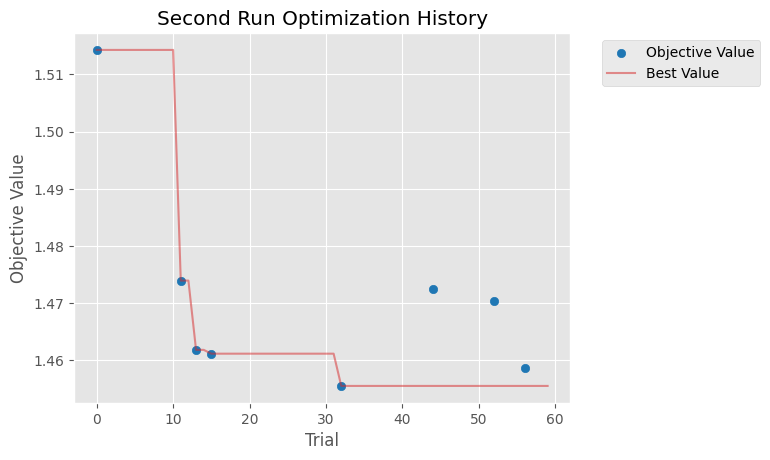

C:\Users\gandj\AppData\Local\Temp\ipykernel_22768\826395869.py:264: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  optuna_matplotlib.plot_param_importances(study_second_run)


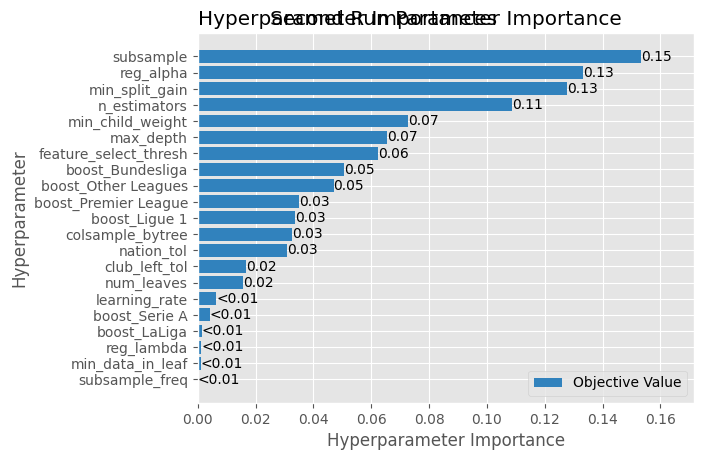

In [27]:
def stage1(trial):
    nation_tol=trial.suggest_float('nation_tol',0.001,0.01)
    club_left_tol=trial.suggest_float('club_left_tol',0.001,0.01)
    #league_left_tol=trial.suggest_float('league_left_tol',0.001,0.01)
    feature_select_thresh=trial.suggest_float('feature_select_thresh',0.0001,0.0085)

    lightgbm_params = {
    'num_leaves':       trial.suggest_int('num_leaves', 16, 48),
    'max_depth':        trial.suggest_int('max_depth', 3, 5),
    'min_data_in_leaf': trial.suggest_int('min_data_in_leaf', 200, 700),
    'learning_rate':    trial.suggest_float('learning_rate', 0.01, 0.05, log=True),
    'n_estimators':     5000,
    'min_split_gain':   trial.suggest_float('min_split_gain', 1e-3, 1.0, log=True),
    'min_child_weight': trial.suggest_float('min_child_weight', 5.0, 40.0, log=True),
    'subsample':        trial.suggest_float('subsample', 0.5, 0.9),
    'subsample_freq':   trial.suggest_int('subsample_freq', 1, 5),
    'colsample_bytree': trial.suggest_float('colsample_bytree', 0.4, 0.8),
    'reg_alpha':        trial.suggest_float('reg_alpha', 1e-3, 10.0, log=True),
    'reg_lambda':       trial.suggest_float('reg_lambda', 20.0, 300.0, log=True),
    }
    
    fold_losses,fold_ns,cv_n_est=[],[],[]
    
    # --- tuned class multipliers (around 1.0) ---
    m = np.array([trial.suggest_float(f"boost_{cls}", 0.8, 1.4) for cls in le.classes_], dtype=float)
    dom = np.argmax(np.bincount(le.transform(y_train)))  # dominant encoded label in TRAIN
    m[dom] = trial.suggest_float(f"boost_{le.classes_[dom]}", 0.7, 1.2)
    m = m / m.mean()  # keep global scale stable
    trial.set_user_attr("class_boosts", m.tolist())

    for train_index,val_index in cv.split(X_train,y_train,groups_fit):
        X_tr=X_train.iloc[train_index]
        X_val=X_train.iloc[val_index]
        y_tr=y_train.iloc[train_index]
        y_val=y_train.iloc[val_index]

        lightgbm_pipeline=Pipeline(
            [
                ('NewFeatures',NewFeatureCreate()),
                ('Club_weight', ClubWeightadder(columns=['Club_Left'],top_club_weights={'Manchester City': 27,'Real Madrid': 26,'FC Bayern München': 25,'FC Paris Saint-Germain': 24,'Inter Mailand': 23,'FC Barcelona': 22,
                                                    'FC Arsenal': 21,'FC Liverpool': 20,'Atlético Madrid': 19,'Borussia Dortmund': 18,'Juventus Turin': 17,'AC Mailand': 16,'Manchester United': 15,'RasenBallsport Leipzig': 14,
                                                    'FC Chelsea': 13,'SSC Neapel': 12,'Newcastle United': 11,'Bayer 04 Leverkusen': 10,'AS Monaco': 9,'Olympique Marseille': 8,'Ajax Amsterdam': 7,'FC Porto': 6,'Benfica Lissabon': 5,
                                                    'Sporting Lissabon': 4,'Galatasaray': 3,'Fenerbahce': 2,'Tottenham Hotspur': 1},non_top_weight=0.05)),
                ('TopClubs',TopClubTransformer(columns=[('Club_Left','League_Left')])),
                ('League_Weight',LeagueWeightEncoder(top_league_weights={'Premier League': 5,'LaLiga': 4,'Bundesliga': 3,'Serie A': 2,'Ligue 1': 1 },columns=['League_Left'])),
                ('TopLeague',TopLeagueTransformer(['League_Left'])),
                ('Nation Binning',RareLabelEncoder(variables='Nation',tol=nation_tol)),
                ('Club_Left Binning', RareLabelEncoder(variables='Club_Left',tol=club_left_tol)),
                ##('League_Left Binning', RareLabelEncoder(variables='League_Left',tol=0.001)),
                ('One-Hot Encoder',OneHotEncoder(variables=['Age','Pos'],drop_last=True)),
                ('Position_Score_FW', PositionScore(pos='FW', balanced_classes=True)),
                ('Position_Score_MF', PositionScore(pos='MF', balanced_classes=True)),
                ('Position_Score_DF', PositionScore(pos='DF', balanced_classes=True)),
                ('Position_Score_GK', PositionScore(pos='GK', balanced_classes=True)),
                ('Class Target Encoding',CatBoostEncoder(cols=['Nation','Club_Left','League_Left'],random_state=101)),
                ('Feature Selector Classification',Feature_Selector_Classification(threshold=feature_select_thresh, random_state=101)),
                #('Light GBM Classifier',LGBMClassifier(**lightgbm_params,class_weight=lgb_xgb_class_weight,num_class=num_class,verbosity=0,objective='multiclass',n_jobs=-1,random_state=101))
            ]
        )
        X_tr_enc=lightgbm_pipeline.fit_transform(X_tr,y_tr)
        X_val_enc=lightgbm_pipeline.transform(X_val)

        y_tr_enc = le.transform(y_tr)
        y_val_enc = le.transform(y_val)

        # --- fold-specific balanced weights × tuned boosts ---
        base_w = compute_class_weight(
            class_weight="balanced",
            classes=np.arange(num_class),
            y=y_tr_enc
        )
        class_w = base_w * m
        w_tr = class_w[y_tr_enc]   # per-sample weights

        prune_cb=LightGBMPruningCallback(trial,metric='multi_logloss')
        #**lightgbm_params,class_weight=lgb_xgb_class_weight,num_class=num_class,verbose=-1 ,objective='multiclass',n_jobs=-1,random_state=101
        lightgbm=LGBMClassifier(**lightgbm_params,num_class=num_class,verbose=-1 ,objective='multiclass',n_jobs=-1,random_state=101)
        #here we compute sample weight, we need the sample weight which we can allocate during the early stopping trial
        ##during the later fitting and learning_curve we can use the predefined compute_class_weight from the whole train set
        
        lightgbm.fit(
            X_tr_enc.values,
            y_tr_enc,
            sample_weight=w_tr,
            eval_set=[(X_val_enc,y_val_enc)],
            eval_metric='multi_logloss',
            callbacks=[early_stopping(stopping_rounds=250),prune_cb]
        )
        pred_proba=lightgbm.predict_proba(X_val_enc)
        #labels=lightgbm.classes_ -> making all classes avaiable that the model has seen
        loss = log_loss(y_val_enc, pred_proba, labels=np.arange(num_class))  # safe per-fold
        fold_losses.append(loss); fold_ns.append(len(y_val))
        cv_n_est.append(getattr(lightgbm,'best_iteration_',lightgbm.get_params().get('n_estimators',None)))


    # CV objective (+ small regularizer to keep boosts ~1.0)
    weighted_cv = float(np.average(fold_losses, weights=fold_ns))
    penalty = 0.01 * float(np.mean(np.log(m) ** 2))  # 0.005–0.02 is typical
    obj = weighted_cv + penalty

    valid_iters = [n for n in cv_n_est if n is not None]
    if valid_iters:
        trial.set_user_attr('best_iteration', int(np.mean(valid_iters)))

    return obj
    #return float(np.average(fold_losses, weights=fold_ns))

study_first_run=optuna.create_study(direction='minimize',sampler=TPESampler(multivariate=True,group=True,constant_liar=True,n_startup_trials=15,seed=101),
                                    pruner=SuccessiveHalvingPruner(min_resource=50,reduction_factor=3))
start_time=time.time()
study_first_run.optimize(stage1,n_trials=40,n_jobs=1)
end_time=time.time()

study1=study_first_run.best_params
study1['n_estimators']=study_first_run.best_trial.user_attrs['best_iteration']
study1_score=study_first_run.best_value

print(f'Best Params: {study1}')
print(f'Best Score: {study1_score}')
print(f'Run Time: {(end_time - start_time)/60:.2f} Minutes')

plt.figure(figsize=(10, 6))
optuna_matplotlib.plot_optimization_history(study_first_run)
plt.title("First Run Optimization History")
plt.show()

optuna_matplotlib.plot_param_importances(study_first_run)
plt.title("First Run Parameter Importance")
plt.show()

plt.rcdefaults()
plt.style.use("default")


def stage2(trial):
    _from_first_run=study1
    nation_tol=trial.suggest_float('nation_tol',(_from_first_run['nation_tol']-_from_first_run['nation_tol']*0.3),(_from_first_run['nation_tol']+_from_first_run['nation_tol']*0.3),log=True)
    club_left_tol=trial.suggest_float('club_left_tol',(_from_first_run['club_left_tol']-_from_first_run['club_left_tol']*0.3),(_from_first_run['club_left_tol']+_from_first_run['club_left_tol']*0.3),log=True)
    #league_left_tol=trial.suggest_float('league_left_tol',(_from_first_run['league_left_tol']-_from_first_run['league_left_tol']*0.3),(_from_first_run['league_left_tol']+_from_first_run['league_left_tol']*0.3),log=True)
    feature_select_thresh=trial.suggest_float('feature_select_thresh',(_from_first_run['feature_select_thresh']-_from_first_run['feature_select_thresh']*0.3),(_from_first_run['feature_select_thresh']+_from_first_run['feature_select_thresh']*0.3),log=True)

    lightgbm_params={
        'num_leaves':trial.suggest_int('num_leaves',int((_from_first_run['num_leaves']-np.floor(_from_first_run['num_leaves']*0.3))),int((_from_first_run['num_leaves']+np.floor(_from_first_run['num_leaves']*0.3)))),
        'max_depth':trial.suggest_int('max_depth',int((_from_first_run['max_depth']-np.floor(_from_first_run['max_depth']*0.3))),int((_from_first_run['max_depth']+np.floor(_from_first_run['max_depth']*0.3)))),
        'min_data_in_leaf':trial.suggest_int('min_data_in_leaf',int((_from_first_run['min_data_in_leaf']-np.floor(_from_first_run['min_data_in_leaf']*0.3))),int((_from_first_run['min_data_in_leaf']+np.floor(_from_first_run['min_data_in_leaf']*0.3)))),
        'learning_rate':trial.suggest_float('learning_rate',(_from_first_run['learning_rate']-_from_first_run['learning_rate']*0.3),(_from_first_run['learning_rate']+_from_first_run['learning_rate']*0.3),log=True),
        'n_estimators':trial.suggest_int('n_estimators',int((_from_first_run['n_estimators']-np.floor(_from_first_run['n_estimators']*0.3))),int((_from_first_run['n_estimators']+np.floor(_from_first_run['n_estimators']*0.3)))),
        'min_split_gain':trial.suggest_float('min_split_gain',(_from_first_run['min_split_gain']-_from_first_run['min_split_gain']*0.3),(_from_first_run['min_split_gain']+_from_first_run['min_split_gain']*0.3),log=True),
        #'max_leaves':trial.suggest_int('max_leaves',(_from_first_run['max_leaves']-np.floor(_from_first_run['max_leaves']*0.3)),(_from_first_run['max_leaves']+np.floor(_from_first_run['max_leaves']*0.3))),
        'min_child_weight':trial.suggest_float('min_child_weight',(_from_first_run['min_child_weight']-_from_first_run['min_child_weight']*0.3),(_from_first_run['min_child_weight']+_from_first_run['min_child_weight']*0.3),log=True),
        'subsample':trial.suggest_float('subsample',(_from_first_run['subsample']-_from_first_run['subsample']*0.3),(_from_first_run['subsample']+_from_first_run['subsample']*0.3),log=True),
        'subsample_freq':trial.suggest_int('subsample_freq',int((_from_first_run['subsample_freq']-np.floor(_from_first_run['subsample_freq']*0.3))),int((_from_first_run['subsample_freq']+np.floor(_from_first_run['subsample_freq']*0.3)))),
        'colsample_bytree':trial.suggest_float('colsample_bytree',(_from_first_run['colsample_bytree']-_from_first_run['colsample_bytree']*0.3),(_from_first_run['colsample_bytree']+_from_first_run['colsample_bytree']*0.3),log=True),
        'reg_alpha':trial.suggest_float('reg_alpha',(_from_first_run['reg_alpha']-_from_first_run['reg_alpha']*0.3),(_from_first_run['reg_alpha']+_from_first_run['reg_alpha']*0.3),log=True),
        'reg_lambda':trial.suggest_float('reg_lambda',(_from_first_run['reg_lambda']-_from_first_run['reg_lambda']*0.3),(_from_first_run['reg_lambda']+_from_first_run['reg_lambda']*0.3),log=True)
    }
    if lightgbm_params['subsample'] > 1.0:
        lightgbm_params['subsample']=1.0
    if lightgbm_params['colsample_bytree'] > 1.0:
        lightgbm_params['colsample_bytree']=1.0



    fold_losses,fold_ns,cv_n_est=[],[],[]
    
    # --- tuned class multipliers (around 1.0) ---
    m = np.array([trial.suggest_float(f"boost_{cls}", 0.8, 1.4) for cls in le.classes_], dtype=float)
    dom = np.argmax(np.bincount(le.transform(y_train)))  # dominant encoded label in TRAIN
    m[dom] = trial.suggest_float(f"boost_{le.classes_[dom]}", 0.7, 1.2)
    m = m / m.mean()  # keep global scale stable
    trial.set_user_attr("class_boosts", m.tolist())

    for train_index,val_index in cv.split(X_train,y_train,groups_fit):
        X_tr=X_train.iloc[train_index]
        X_val=X_train.iloc[val_index]
        y_tr=y_train.iloc[train_index]
        y_val=y_train.iloc[val_index]

        lightgbm_pipeline=Pipeline(
            [
                ('NewFeatures',NewFeatureCreate()),
                ('Club_weight', ClubWeightadder(columns=['Club_Left'],top_club_weights={'Manchester City': 27,'Real Madrid': 26,'FC Bayern München': 25,'FC Paris Saint-Germain': 24,'Inter Mailand': 23,'FC Barcelona': 22,
                                                    'FC Arsenal': 21,'FC Liverpool': 20,'Atlético Madrid': 19,'Borussia Dortmund': 18,'Juventus Turin': 17,'AC Mailand': 16,'Manchester United': 15,'RasenBallsport Leipzig': 14,
                                                    'FC Chelsea': 13,'SSC Neapel': 12,'Newcastle United': 11,'Bayer 04 Leverkusen': 10,'AS Monaco': 9,'Olympique Marseille': 8,'Ajax Amsterdam': 7,'FC Porto': 6,'Benfica Lissabon': 5,
                                                    'Sporting Lissabon': 4,'Galatasaray': 3,'Fenerbahce': 2,'Tottenham Hotspur': 1},non_top_weight=0.05)),
                ('TopClubs',TopClubTransformer(columns=[('Club_Left','League_Left')])),
                ('League_Weight',LeagueWeightEncoder(top_league_weights={'Premier League': 5,'LaLiga': 4,'Bundesliga': 3,'Serie A': 2,'Ligue 1': 1 },columns=['League_Left'])),
                ('TopLeague',TopLeagueTransformer(['League_Left'])),
                ('Nation Binning',RareLabelEncoder(variables='Nation',tol=nation_tol)),
                ('Club_Left Binning', RareLabelEncoder(variables='Club_Left',tol=club_left_tol)),
                ##('League_Left Binning', RareLabelEncoder(variables='League_Left',tol=0.001)),
                ('One-Hot Encoder',OneHotEncoder(variables=['Age','Pos'],drop_last=True)),
                ('Position_Score_FW', PositionScore(pos='FW', balanced_classes=True)),
                ('Position_Score_MF', PositionScore(pos='MF', balanced_classes=True)),
                ('Position_Score_DF', PositionScore(pos='DF', balanced_classes=True)),
                ('Position_Score_GK', PositionScore(pos='GK', balanced_classes=True)),
                ('Class Target Encoding',CatBoostEncoder(cols=['Nation','Club_Left','League_Left'],random_state=101)),
                ('Feature Selector Classification',Feature_Selector_Classification(threshold=feature_select_thresh, random_state=101)),
                #('Light GBM Classifier',LGBMClassifier(**lightgbm_params,class_weight=lgb_xgb_class_weight,num_class=num_class,verbosity=0,objective='multiclass',n_jobs=-1,random_state=101))
            ]
        )
        X_tr_enc=lightgbm_pipeline.fit_transform(X_tr,y_tr)
        X_val_enc=lightgbm_pipeline.transform(X_val)

        y_tr_enc = le.transform(y_tr)
        y_val_enc = le.transform(y_val)

        # --- fold-specific balanced weights × tuned boosts ---
        base_w = compute_class_weight(
            class_weight="balanced",
            classes=np.arange(num_class),
            y=y_tr_enc
        )
        class_w = base_w * m
        w_tr = class_w[y_tr_enc]   # per-sample weights

        prune_cb=LightGBMPruningCallback(trial,metric='multi_logloss')
        #**lightgbm_params,class_weight=lgb_xgb_class_weight,num_class=num_class,verbose=-1 ,objective='multiclass',n_jobs=-1,random_state=101
        lightgbm=LGBMClassifier(**lightgbm_params,num_class=num_class,verbose=-1 ,objective='multiclass',n_jobs=-1,random_state=101)
        #here we compute sample weight, we need the sample weight which we can allocate during the early stopping trial
        ##during the later fitting and learning_curve we can use the predefined compute_class_weight from the whole train set
        
        lightgbm.fit(
            X_tr_enc.values,
            y_tr_enc,
            sample_weight=w_tr,
            eval_set=[(X_val_enc,y_val_enc)],
            eval_metric='multi_logloss',
            callbacks=[early_stopping(stopping_rounds=250),prune_cb]
        )
        pred_proba=lightgbm.predict_proba(X_val_enc)
        #labels=lightgbm.classes_ -> making all classes avaiable that the model has seen
        loss = log_loss(y_val_enc, pred_proba, labels=np.arange(num_class))  # safe per-fold
        fold_losses.append(loss); fold_ns.append(len(y_val))
        cv_n_est.append(getattr(lightgbm,'best_iteration_',lightgbm.get_params().get('n_estimators',None)))


    # CV objective (+ small regularizer to keep boosts ~1.0)
    weighted_cv = float(np.average(fold_losses, weights=fold_ns))
    penalty = 0.01 * float(np.mean(np.log(m) ** 2))  # 0.005–0.02 is typical
    obj = weighted_cv + penalty

    valid_iters = [n for n in cv_n_est if n is not None]
    if valid_iters:
        trial.set_user_attr('best_iteration', int(np.mean(valid_iters)))

    return obj

study_second_run=optuna.create_study(direction='minimize',sampler=TPESampler(multivariate=True,group=True,constant_liar=True,n_startup_trials=15,seed=101),
                                    pruner=SuccessiveHalvingPruner(min_resource=50,reduction_factor=3))
start_time=time.time()
study_second_run.optimize(stage2,n_trials=60,n_jobs=-1)
end_time=time.time()

print(f'Best Params: {study_second_run.best_params}')
print(f'Best Score: {study_second_run.best_value}')
print(f'Run Time: {(end_time - start_time)/60:.2f} Minutes')

plt.figure(figsize=(10, 6))
optuna_matplotlib.plot_optimization_history(study_second_run)
plt.title("Second Run Optimization History")
plt.show()

optuna_matplotlib.plot_param_importances(study_second_run)
plt.title("Second Run Parameter Importance")
plt.show()

plt.rcdefaults()
plt.style.use("default")

first_run  = study_first_run.best_params.copy()
second_run = study_second_run.best_params.copy()

best_iter_s1 = study_first_run.best_trial.user_attrs.get("best_iteration")
best_iter_s2 = study_second_run.best_trial.user_attrs.get("best_iteration")

if best_iter_s1 is not None:
    first_run["n_estimators"] = int(best_iter_s1)
if best_iter_s2 is not None:
    second_run["n_estimators"] = int(best_iter_s2)

final_params = first_run if study_first_run.best_value < study_second_run.best_value else second_run
best_score=study_first_run.best_value if study_first_run.best_value < study_second_run.best_value else study_second_run.best_value

In [28]:
second_run

{'nation_tol': 0.005914441331811886,
 'club_left_tol': 0.007225620015954129,
 'feature_select_thresh': 0.0021712168777540206,
 'num_leaves': 41,
 'max_depth': 4,
 'min_data_in_leaf': 318,
 'learning_rate': 0.030768811756486256,
 'n_estimators': 506,
 'min_split_gain': 0.11973826569379543,
 'min_child_weight': 32.173839229855275,
 'subsample': 0.8952842691481087,
 'subsample_freq': 1,
 'colsample_bytree': 0.6058522913455117,
 'reg_alpha': 0.0032985112524320666,
 'reg_lambda': 92.58826305658219,
 'boost_Bundesliga': 0.9420899933154842,
 'boost_LaLiga': 0.8623117500348244,
 'boost_Ligue 1': 0.9470009501880006,
 'boost_Other Leagues': 1.3783283187114146,
 'boost_Premier League': 1.2880564731995738,
 'boost_Serie A': 1.004168976617675}

In [29]:
final_params

{'nation_tol': 0.005914441331811886,
 'club_left_tol': 0.007225620015954129,
 'feature_select_thresh': 0.0021712168777540206,
 'num_leaves': 41,
 'max_depth': 4,
 'min_data_in_leaf': 318,
 'learning_rate': 0.030768811756486256,
 'n_estimators': 506,
 'min_split_gain': 0.11973826569379543,
 'min_child_weight': 32.173839229855275,
 'subsample': 0.8952842691481087,
 'subsample_freq': 1,
 'colsample_bytree': 0.6058522913455117,
 'reg_alpha': 0.0032985112524320666,
 'reg_lambda': 92.58826305658219,
 'boost_Bundesliga': 0.9420899933154842,
 'boost_LaLiga': 0.8623117500348244,
 'boost_Ligue 1': 0.9470009501880006,
 'boost_Other Leagues': 1.3783283187114146,
 'boost_Premier League': 1.2880564731995738,
 'boost_Serie A': 1.004168976617675}

### Learning Curve Light GBM Classification

The final model will use the hyperparameters of Run Two
Train Size: 177.0 | Train Score: 1.7463816681736346 | Val Score: 1.777590760922351
Train Size: 355.0 | Train Score: 1.7794019024676593 | Val Score: 1.800677707313072
Train Size: 532.0 | Train Score: 1.7891659691570396 | Val Score: 1.7995288743150215
Train Size: 710.0 | Train Score: 1.5870728810543686 | Val Score: 1.6778699941987114
Train Size: 887.0 | Train Score: 1.4409678941734891 | Val Score: 1.5901965463643486
Train Size: 1065.0 | Train Score: 1.3921770165948015 | Val Score: 1.556592419199478
Train Size: 1242.0 | Train Score: 1.33864212293269 | Val Score: 1.527495070205609
Train Size: 1420.0 | Train Score: 1.310111637527886 | Val Score: 1.4991728166386884
Train Size: 1597.0 | Train Score: 1.2635307167010017 | Val Score: 1.4747508887666076
Train Size: 1775.0 | Train Score: 1.2483230812783113 | Val Score: 1.4628781007325506


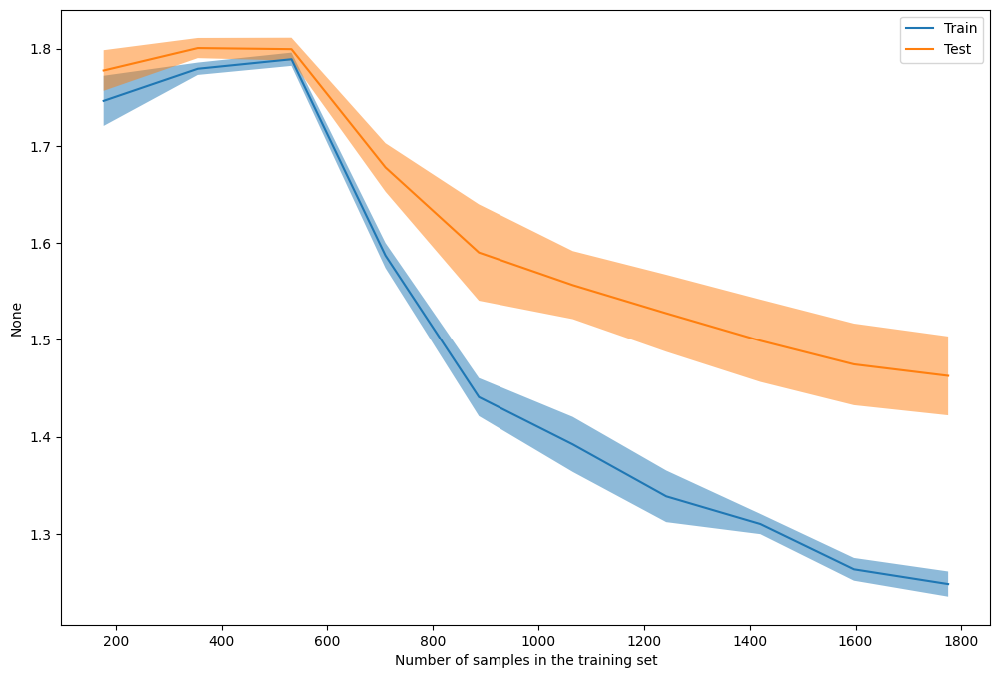

In [30]:
print(f'The final model will use the hyperparameters of {"Run One" if study_first_run.best_value < study_second_run.best_value else "Run Two"}')

best_params=final_params
if best_params['subsample']>1.0:
    best_params['subsample']=1.0

lightgbm_params={
        'num_leaves':best_params['num_leaves'],
        'max_depth':best_params['max_depth'],
        'min_data_in_leaf':best_params['min_data_in_leaf'],
        'learning_rate':best_params['learning_rate'],
        'n_estimators':best_params['n_estimators'],
        'min_split_gain':best_params['min_split_gain'],
        #'max_leaves':best_params['max_leaves'],
        'min_child_weight':best_params['min_child_weight'],
        'subsample':best_params['subsample'],
        'subsample_freq':best_params['subsample_freq'],
        'colsample_bytree':best_params['colsample_bytree'],
        'reg_alpha':best_params['reg_alpha'],
        'reg_lambda':best_params['reg_lambda']
    }

#ToNumpy = FunctionTransformer(lambda X: X.to_numpy() if hasattr(X, "to_numpy") else np.asarray(X))

lightgbm_final_pipeline=Pipeline(
        [
            ('NewFeatures',NewFeatureCreate()),
            ('Club_weight', ClubWeightadder(columns=['Club_Left'],top_club_weights={'Manchester City': 27,'Real Madrid': 26,'FC Bayern München': 25,'FC Paris Saint-Germain': 24,'Inter Mailand': 23,'FC Barcelona': 22,
                                                'FC Arsenal': 21,'FC Liverpool': 20,'Atlético Madrid': 19,'Borussia Dortmund': 18,'Juventus Turin': 17,'AC Mailand': 16,'Manchester United': 15,'RasenBallsport Leipzig': 14,
                                                'FC Chelsea': 13,'SSC Neapel': 12,'Newcastle United': 11,'Bayer 04 Leverkusen': 10,'AS Monaco': 9,'Olympique Marseille': 8,'Ajax Amsterdam': 7,'FC Porto': 6,'Benfica Lissabon': 5,
                                                'Sporting Lissabon': 4,'Galatasaray': 3,'Fenerbahce': 2,'Tottenham Hotspur': 1},non_top_weight=0.05)),
            ('TopClubs',TopClubTransformer(columns=[('Club_Left','League_Left')])),
            ('League_Weight',LeagueWeightEncoder(top_league_weights={'Premier League': 5,'LaLiga': 4,'Bundesliga': 3,'Serie A': 2,'Ligue 1': 1 },columns=['League_Left'])),
            ('TopLeague',TopLeagueTransformer(['League_Left'])),
            ('Nation Binning',RareLabelEncoder(variables='Nation',tol=best_params['nation_tol'])),
            ('Club_Left Binning', RareLabelEncoder(variables='Club_Left',tol=best_params['club_left_tol'])),
            ##('League_Left Binning', RareLabelEncoder(variables='League_Left',tol=0.001)),
            ('One-Hot Encoder',OneHotEncoder(variables=['Age','Pos'],drop_last=True)),
            ('Position_Score_FW', PositionScore(pos='FW', balanced_classes=True)),
            ('Position_Score_MF', PositionScore(pos='MF', balanced_classes=True)),
            ('Position_Score_DF', PositionScore(pos='DF', balanced_classes=True)),
            ('Position_Score_GK', PositionScore(pos='GK', balanced_classes=True)),
            ('Class Target Encoding',CatBoostEncoder(cols=['Nation','Club_Left','League_Left'],random_state=101)),
            ('Feature Selector Classification',Feature_Selector_Classification(threshold=best_params['feature_select_thresh'], random_state=101)),
            #('ToNumpy', ToNumpy),
            ('Light GBM Classifier',LGBMClassifier(**lightgbm_params,class_weight=lgb_xgb_class_weight,objective='multiclass',n_jobs=-1,random_state=101))
        ]
        )

train_sizes,train_scores,val_scores=learning_curve(
    estimator=lightgbm_final_pipeline,
    X=X_train,
    y=y_train,
    groups=groups_fit,
    train_sizes=np.linspace(0.1,1.0,10),
    cv=cv,
    shuffle=True,
    scoring='neg_log_loss',
    n_jobs=-1,
    random_state=101
)

for train_size, cv_train_scores, cv_val_scores in zip(train_sizes, train_scores, val_scores):
    print(f'Train Size: {np.mean(train_size)} | Train Score: {np.mean(cv_train_scores)*-1} | Val Score: {np.mean(cv_val_scores)*-1}')


fig, ax = plt.subplots(figsize=(12,8))
display_lc=LearningCurveDisplay(
    train_sizes=(train_sizes),
    train_scores=(train_scores)*-1,
    test_scores=(val_scores)*-1
)
display_lc.plot(ax=ax)

### Classification Report Light GBM

c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\sklearn\calibration.py:330: FutureWarning: The `cv='prefit'` option is deprecated in 1.6 and will be removed in 1.8. You can use CalibratedClassifierCV(FrozenEstimator(estimator)) instead.
  warnings.warn(


Log Loss Score: 1.4472189176070356
Macro F1-Score: 0.4196181699485077
                precision    recall  f1-score   support

    Bundesliga       0.58      0.38      0.46        78
        LaLiga       0.61      0.36      0.45       112
       Ligue 1       0.35      0.24      0.28        71
 Other Leagues       0.37      0.60      0.46       187
Premier League       0.32      0.32      0.32        84
       Serie A       0.60      0.50      0.55       156

      accuracy                           0.44       688
     macro avg       0.47      0.40      0.42       688
  weighted avg       0.48      0.44      0.44       688

Top-1: 0.4433139534883721
Top-3: 0.7863372093023255
Top-5: 0.9476744186046512


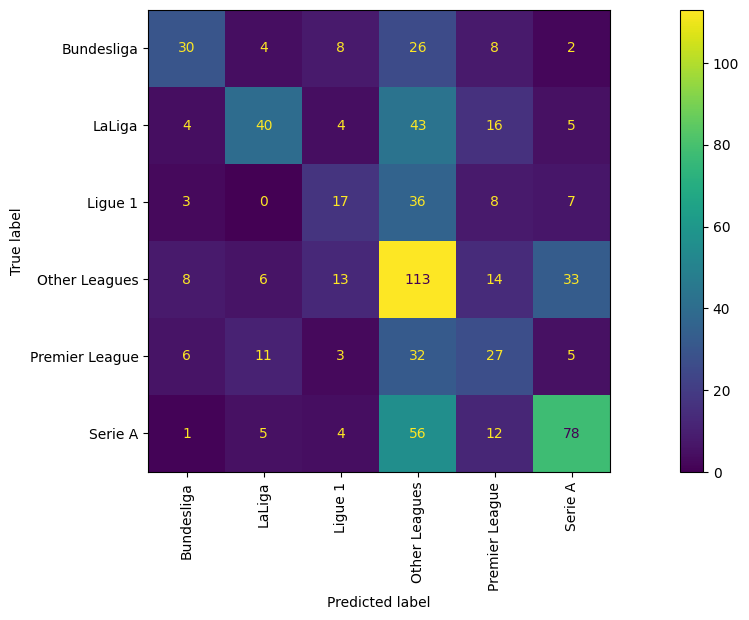

In [31]:
lightgbm_final_pipeline=Pipeline(
        [
            ('NewFeatures',NewFeatureCreate()),
            ('Club_weight', ClubWeightadder(columns=['Club_Left'],top_club_weights={'Manchester City': 27,'Real Madrid': 26,'FC Bayern München': 25,'FC Paris Saint-Germain': 24,'Inter Mailand': 23,'FC Barcelona': 22,
                                                'FC Arsenal': 21,'FC Liverpool': 20,'Atlético Madrid': 19,'Borussia Dortmund': 18,'Juventus Turin': 17,'AC Mailand': 16,'Manchester United': 15,'RasenBallsport Leipzig': 14,
                                                'FC Chelsea': 13,'SSC Neapel': 12,'Newcastle United': 11,'Bayer 04 Leverkusen': 10,'AS Monaco': 9,'Olympique Marseille': 8,'Ajax Amsterdam': 7,'FC Porto': 6,'Benfica Lissabon': 5,
                                                'Sporting Lissabon': 4,'Galatasaray': 3,'Fenerbahce': 2,'Tottenham Hotspur': 1},non_top_weight=0.05)),
            ('TopClubs',TopClubTransformer(columns=[('Club_Left','League_Left')])),
            ('League_Weight',LeagueWeightEncoder(top_league_weights={'Premier League': 5,'LaLiga': 4,'Bundesliga': 3,'Serie A': 2,'Ligue 1': 1 },columns=['League_Left'])),
            ('TopLeague',TopLeagueTransformer(['League_Left'])),
            ('Nation Binning',RareLabelEncoder(variables='Nation',tol=best_params['nation_tol'])),
            ('Club_Left Binning', RareLabelEncoder(variables='Club_Left',tol=best_params['club_left_tol'])),
            ##('League_Left Binning', RareLabelEncoder(variables='League_Left',tol=0.001)),
            ('One-Hot Encoder',OneHotEncoder(variables=['Age','Pos'],drop_last=True)),
            ('Position_Score_FW', PositionScore(pos='FW', balanced_classes=True)),
            ('Position_Score_MF', PositionScore(pos='MF', balanced_classes=True)),
            ('Position_Score_DF', PositionScore(pos='DF', balanced_classes=True)),
            ('Position_Score_GK', PositionScore(pos='GK', balanced_classes=True)),
            ('Class Target Encoding',CatBoostEncoder(cols=['Nation','Club_Left','League_Left'],random_state=101)),
            ('Feature Selector Classification',Feature_Selector_Classification(threshold=best_params['feature_select_thresh'], random_state=101)),
            #('ToNumpy', ToNumpy),
            ('Light GBM Classifier',LGBMClassifier(**lightgbm_params,class_weight=lgb_xgb_class_weight,objective='multiclass',n_jobs=-1,random_state=101))
        ]
        )

lightgbm_final_pipeline.fit(X_train,y_train)

ccv=CalibratedClassifierCV(estimator=lightgbm_final_pipeline,method='sigmoid',cv='prefit')
ccv.fit(X_cal,y_cal)
y_proba=ccv.predict_proba(X_test)
y_pred=ccv.predict(X_test)

print(f'Log Loss Score: {log_loss(y_test,y_proba,labels=ccv.classes_)}')

print(f'Macro F1-Score: {f1_score(y_test,y_pred,average="macro")}')

print(classification_report(y_test,y_pred))

cm=confusion_matrix(y_test,y_pred)
fig, ax = plt.subplots(figsize=(18,6))
CM=ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=ccv.classes_)
CM.plot(ax=ax)
plt.xticks(rotation=90)

# top-1 (normal accuracy)
acc1 = top_k_accuracy_score(y_test, y_proba, k=1,labels=ccv.classes_)

# top-3
acc3 = top_k_accuracy_score(y_test, y_proba, k=3,labels=ccv.classes_)

# top-5
acc5 = top_k_accuracy_score(y_test, y_proba, k=5,labels=ccv.classes_)

print("Top-1:", acc1)
print("Top-3:", acc3)
print("Top-5:", acc5)

In [32]:
performance_dict={
    'Light GBM Classification': {'Log Loss':best_score,'Macro F1-Score':f1_score(y_test,y_pred,average="macro"),'Run Time in Minutes':round((end_time - start_time)/60,2)}
}
performance_df=pd.DataFrame.from_dict(performance_dict,orient='index')

file_path = r'..\..\Models\Performance\Performance.csv'

save_model_performance(performance_df,file_path)

## XGBoost

c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\_experimental.py:32: ExperimentalWarning: Argument ``multivariate`` is an experimental feature. The interface can change in the future.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\_experimental.py:32: ExperimentalWarning: Argument ``group`` is an experimental feature. The interface can change in the future.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\_experimental.py:32: ExperimentalWarning: Argument ``constant_liar`` is an experimental feature. The interface can change in the future.
  warnings.warn(
[I 2025-09-21 20:25:02,929] A new study created in memory with name: no-name-41c16d4e-9ac2-4bcc-9ba3-a5babaea7d1d
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Li

Best Params: {'nation_tol': 0.0012775929891626016, 'club_left_tol': 0.006329075536536628, 'feature_select_thresh': 0.0029288949015738143, 'tree_method': 'hist', 'gamma': 4.07257044080948, 'eta': 0.027179501471700295, 'max_delta_step': 8, 'min_child_weight': 32.77105830800021, 'grow_policy': 'lossguide', 'subsample': 0.6333513444551916, 'colsample_bytree': 0.561265511779571, 'colsample_bylevel': 0.6739557511275509, 'colsample_bynode': 0.6792102941432492, 'alpha': 0.4392160481764469, 'lambda': 29.705747998122167, 'max_bins': 72, 'max_leaves': 8, 'boost_Bundesliga': 0.9997347558601394, 'boost_LaLiga': 1.0357320904463243, 'boost_Ligue 1': 1.280780697267404, 'boost_Other Leagues': 1.337337060451266, 'boost_Premier League': 1.2531356578901627, 'boost_Serie A': 1.2014191578828326, 'n_estimators': 1328, 'booster': 'gbtree'}
Best Score: 1.4621458873970248
Run Time: 27.52 Minutes


C:\Users\gandj\AppData\Local\Temp\ipykernel_35660\321286009.py:172: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  optuna_matplotlib.plot_optimization_history(study_first_run)


<Figure size 1000x600 with 0 Axes>

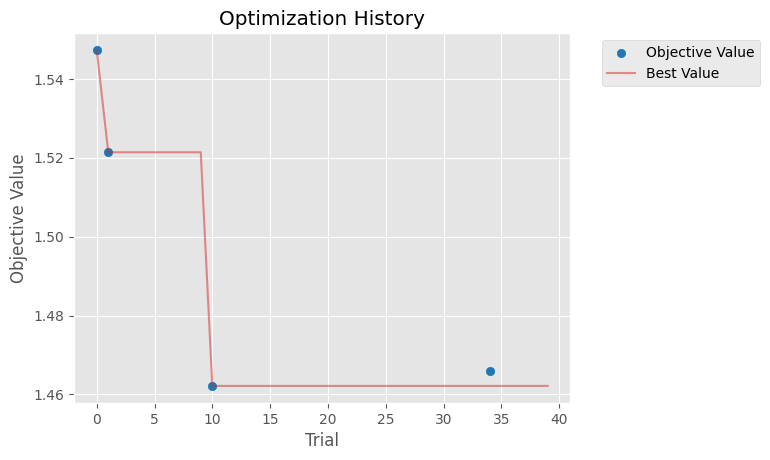

C:\Users\gandj\AppData\Local\Temp\ipykernel_35660\321286009.py:176: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  optuna_matplotlib.plot_param_importances(study_first_run)


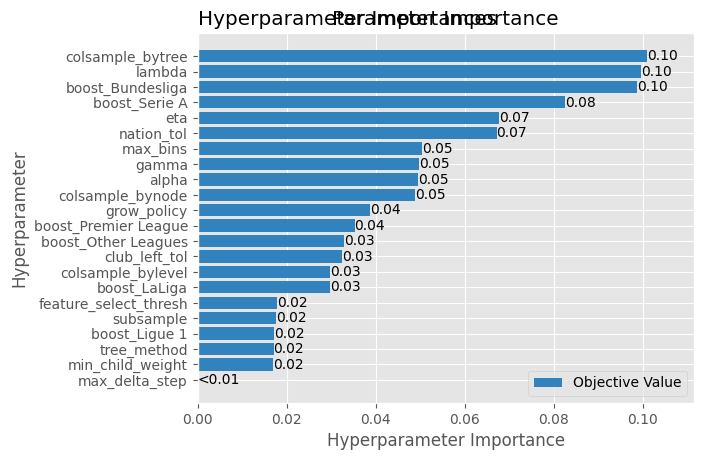

c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\_experimental.py:32: ExperimentalWarning: Argument ``multivariate`` is an experimental feature. The interface can change in the future.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\_experimental.py:32: ExperimentalWarning: Argument ``group`` is an experimental feature. The interface can change in the future.
  warnings.warn(
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\optuna\_experimental.py:32: ExperimentalWarning: Argument ``constant_liar`` is an experimental feature. The interface can change in the future.
  warnings.warn(
[I 2025-09-21 20:52:34,739] A new study created in memory with name: no-name-ab65a334-8d98-4871-a7cb-0938f70298bc
c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Li

Best Params: {'nation_tol': 0.0013397997743738708, 'club_left_tol': 0.007651587198168686, 'feature_select_thresh': 0.0035611038658788165, 'gamma': 3.145878229461535, 'eta': 0.031171153653310038, 'max_delta_step': 10, 'min_child_weight': 24.250382517618814, 'subsample': 0.8085552670095294, 'colsample_bytree': 0.6755963623313371, 'colsample_bylevel': 0.8047070429387263, 'colsample_bynode': 0.5782234581726118, 'alpha': 0.3409643315613662, 'lambda': 29.447188267339126, 'max_bins': 93, 'max_leaves': 5, 'boost_Bundesliga': 1.1837415524036157, 'boost_LaLiga': 0.9711110766102418, 'boost_Ligue 1': 0.9418920951141292, 'boost_Other Leagues': 1.0120515947529463, 'boost_Premier League': 1.0291557752804064, 'boost_Serie A': 1.0331655889267122, 'booster': 'gbtree', 'grow_policy': 'lossguide', 'tree_method': 'hist', 'n_estimators': 1256}
Best Score: 1.4374888039040767
Run Time: 31.76 Minutes


C:\Users\gandj\AppData\Local\Temp\ipykernel_35660\321286009.py:363: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  optuna_matplotlib.plot_optimization_history(study_second_run)


<Figure size 1000x600 with 0 Axes>

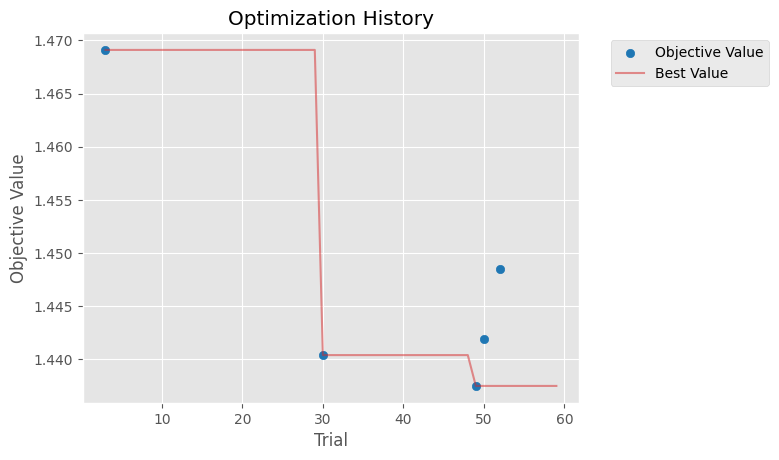

C:\Users\gandj\AppData\Local\Temp\ipykernel_35660\321286009.py:367: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  optuna_matplotlib.plot_param_importances(study_second_run)


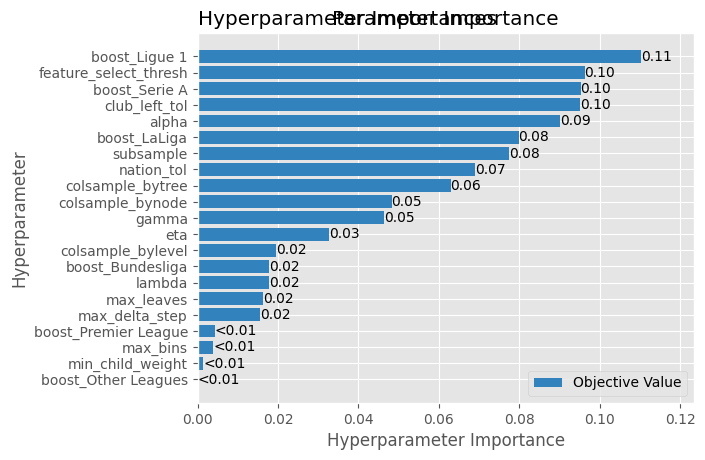

In [ ]:
def stage1(trial):
    nation_tol=trial.suggest_float('nation_tol',0.001,0.01)
    club_left_tol=trial.suggest_float('club_left_tol',0.001,0.01)
    #league_left_tol=trial.suggest_float('league_left_tol',0.001,0.01)
    feature_select_thresh=trial.suggest_float('feature_select_thresh',0.0001,0.0085)
    

    # --- CatBoost-only params (no num_leaves; no max_leaves unless Lossguide)
    xgb_params = {
        #'booster': trial.suggest_categorical('booster', ['gbtree','dart']),
        'booster': 'gbtree',
        #'multi:softmax' -> looks for accuracy; 'multi:softprob' looks for probability
        'objective': 'multi:softprob', #trial.suggest_categorical('objective',['multi:softmax','multi:softprob']),
        #'n_estimators':8000,
        'num_class': num_class,
        'tree_method':trial.suggest_categorical('tree_method',['hist','approx']),
        'gamma': trial.suggest_float('gamma', 3.0, 8.0, log=True),
        'eta': trial.suggest_float('eta', 0.015, 0.03, log=True),
        'max_delta_step': trial.suggest_int('max_delta_step', 6, 10),
        'min_child_weight': trial.suggest_float('min_child_weight', 25.0, 40.0, log=True),
        'grow_policy': trial.suggest_categorical('grow_policy', ['depthwise','lossguide']),
        'subsample': trial.suggest_float('subsample', 0.55, 0.65),
        'colsample_bytree': trial.suggest_float('colsample_bytree',0.45, 0.6, log=True),
        'colsample_bylevel': trial.suggest_float('colsample_bylevel',0.6, 0.9, log=True),
        'colsample_bynode': trial.suggest_float('colsample_bynode',0.6, 0.9, log=True),
        'alpha': trial.suggest_float('alpha',0.1, 0.6, log=True),
        'lambda': trial.suggest_float('lambda',20.0, 40.0, log=True),
        'eval_metric':'mlogloss',
        'nthread':-1,
        'verbosity':0,
        'seed':101

    }
    if xgb_params['tree_method'] in ['hist','approx']:
        xgb_params['max_bin'] = trial.suggest_int('max_bin',64,96)
    if xgb_params['booster'] == 'dart':
        xgb_params['sample_type']= trial.suggest_categorical('sample_type',['uniform','weighted'])
        xgb_params['normalize_type']= trial.suggest_categorical('normalize_type',['tree','forest'])
        xgb_params['rate_drop']= trial.suggest_float('rate_drop',0.1,0.8)
        xgb_params['one_drop']= trial.suggest_int('one_drop',0,1)
        xgb_params['skip_drop']= trial.suggest_float('skip_drop',0.1,0.8)
    if xgb_params['grow_policy']=='depthwise':
        xgb_params['max_depth']=trial.suggest_int('max_depth',2,3)
    elif xgb_params['grow_policy']=='lossguide':
        xgb_params['max_leaves']=trial.suggest_int('max_leaves',8,16)
        xgb_params['max_depth']=0



    base_pipe_xgb=Pipeline(
        [
            ('NewFeatures',NewFeatureCreate()),
            ('Club_weight', ClubWeightadder(columns=['Club_Left'],top_club_weights={'Manchester City': 27,'Real Madrid': 26,'FC Bayern München': 25,'FC Paris Saint-Germain': 24,'Inter Mailand': 23,'FC Barcelona': 22,
                                                'FC Arsenal': 21,'FC Liverpool': 20,'Atlético Madrid': 19,'Borussia Dortmund': 18,'Juventus Turin': 17,'AC Mailand': 16,'Manchester United': 15,'RasenBallsport Leipzig': 14,
                                                'FC Chelsea': 13,'SSC Neapel': 12,'Newcastle United': 11,'Bayer 04 Leverkusen': 10,'AS Monaco': 9,'Olympique Marseille': 8,'Ajax Amsterdam': 7,'FC Porto': 6,'Benfica Lissabon': 5,
                                                'Sporting Lissabon': 4,'Galatasaray': 3,'Fenerbahce': 2,'Tottenham Hotspur': 1},non_top_weight=0.05)),
            ('TopClubs',TopClubTransformer(columns=[('Club_Left','League_Left')])),
            ('League_Weight',LeagueWeightEncoder(top_league_weights={'Premier League': 5,'LaLiga': 4,'Bundesliga': 3,'Serie A': 2,'Ligue 1': 1 },columns=['League_Left'])),
            ('TopLeague',TopLeagueTransformer(['League_Left'])),
            ('Nation Binning',RareLabelEncoder(variables='Nation',tol=nation_tol)),
            ('Club_Left Binning', RareLabelEncoder(variables='Club_Left',tol=club_left_tol)),
            ##('League_Left Binning', RareLabelEncoder(variables='League_Left',tol=0.001)),
            ('One-Hot Encoder',OneHotEncoder(variables=['Age','Pos'],drop_last=True)),
            ('Position_Score_FW', PositionScore(pos='FW', balanced_classes=True)),
            ('Position_Score_MF', PositionScore(pos='MF', balanced_classes=True)),
            ('Position_Score_DF', PositionScore(pos='DF', balanced_classes=True)),
            ('Position_Score_GK', PositionScore(pos='GK', balanced_classes=True)),
            ('Class Target Encoding',CatBoostEncoder(cols=['Nation','Club_Left','League_Left'],random_state=101)),
            ('Feature Selector Classification',Feature_Selector_Classification(threshold=feature_select_thresh, random_state=101)),
        ]
        )

    fold_losses,fold_ns,best_trees = [],[],[]
    #need to encode y features, otherwise XGBoost is not able to prrocess it

    # -------- NEW: per-class boost multipliers (around 1.0), tuned by Optuna --------
    # one multiplier per encoded class (use the global LabelEncoder `le` you already fit on y_train)
    m = np.array([trial.suggest_float(f"boost_{cls}", 0.8, 1.4) for cls in le.classes_], dtype=float)

    # optional: slightly tighter range for the dominant class in the TRAIN set
    dom = np.argmax(np.bincount(le.transform(y_train)))   # dominant encoded label in TRAIN
    m[dom] = trial.suggest_float(f"boost_{le.classes_[dom]}", 0.7, 1.2)

    # normalize so the average boost is ~1 (keeps overall scale stable)
    m = m / m.mean()

    # keep for later (so you can reuse best multipliers after the study)
    trial.set_user_attr("class_boosts", m.tolist())
    # -------------------------------------------------------------------------------

    for tr_idx,val_idx in cv.split(X_train,y_train,groups_fit):
        X_tr,X_val=X_train.iloc[tr_idx],X_train.iloc[val_idx]
        y_tr,y_val=y_train.iloc[tr_idx],y_train.iloc[val_idx]

        pipe = clone(base_pipe_xgb)
        #using not the encoded y, pipelien will deal with it
        X_tr_t = pipe.fit_transform(X_tr, y_tr)   # fit on train
        X_va_t = pipe.transform(X_val)

        #xgboost is not able to process the raw string values
        y_tr_enc=le.transform(y_tr)
        y_val_enc=le.transform(y_val)

        # -------- NEW: combine balanced base weights with tuned boosts ---------------
        # compute base class weights on THIS FOLD's training labels
        base_w = compute_class_weight(
            class_weight='balanced',
            classes=np.arange(num_class),
            y=y_tr_enc
        )
        # final per-class weights = base * boost
        class_w = base_w * m
        # per-sample weights for DMatrix
        w_tr = class_w[y_tr_enc]
    # ---------------------------------------------------------------------------

        dtrain=xgboost.DMatrix(X_tr_t,label=y_tr_enc,weight=w_tr)
        dvalid=xgboost.DMatrix(X_va_t,label=y_val_enc)

        bst=xgboost.train(
            params=xgb_params,
            dtrain=dtrain,
            num_boost_round=6000,
            #just (dvalid,'valid') -> we care only about 
            evals=[(dtrain,'train'),(dvalid,'valid')],
            callbacks=[xgboost.callback.EarlyStopping(rounds=150,save_best=True),XGBoostPruningCallback(trial,'valid-mlogloss')],
            verbose_eval=0
        )

        # predict probabilities for valid fold, due to 
        proba = bst.predict(dvalid, iteration_range=(0, bst.best_iteration + 1))
        loss = log_loss(y_val_enc, proba, labels=np.arange(num_class))
        fold_losses.append(loss)
        fold_ns.append(len(y_val_enc))
        best_trees.append(bst.best_iteration)
    
    # average CV loss
    weighted_cv_logloss = float(np.average(fold_losses, weights=fold_ns))

    # -------- OPTIONAL: regularize the boosts so they stay near 1.0 ----------------
    # a small L2 penalty on log(m) is stable; tune 0.005–0.02 if needed
    penalty = 0.01 * float(np.mean(np.log(m) ** 2))
    objective = weighted_cv_logloss + penalty
    # -------------------------------------------------------------------------------

    #adding the number of iterations
    if best_trees:
        trial.set_user_attr("n_estimators", int(np.mean(best_trees)))
    #return float(np.average(fold_losses, weights=fold_ns))
    return objective

study_first_run=optuna.create_study(direction='minimize',sampler=TPESampler(multivariate=True,group=True,constant_liar=True,n_startup_trials=15,seed=101),
                                    pruner=SuccessiveHalvingPruner(min_resource=50,reduction_factor=3))
start_time=time.time()
study_first_run.optimize(stage1,n_trials=40)
end_time=time.time()

study1_params=study_first_run.best_params
#study1_params['grow_policy']='SymmetricTree'
study1_best_iter = study_first_run.best_trial.user_attrs["n_estimators"]
#study1_params['objective']='multi:softprob'
study1_params["n_estimators"] = study1_best_iter
study1_params['booster']='gbtree'

study1_score=study_first_run.best_value

print(f'Best Params: {study1_params}')
print(f'Best Score: {study1_score}')
print(f'Run Time: {(end_time - start_time)/60:.2f} Minutes')

plt.figure(figsize=(10, 6))
optuna_matplotlib.plot_optimization_history(study_first_run)
plt.title("Optimization History")
plt.show()

optuna_matplotlib.plot_param_importances(study_first_run)

plt.title("Parameter Importance")
plt.show()
plt.rcdefaults()
plt.style.use("default")

def stage2(trial):
    nation_tol=trial.suggest_float('nation_tol',(study1_params['nation_tol']-study1_params['nation_tol']*0.3),(study1_params['nation_tol']+study1_params['nation_tol']*0.3))
    club_left_tol=trial.suggest_float('club_left_tol',(study1_params['club_left_tol']-study1_params['club_left_tol']*0.3),(study1_params['club_left_tol']+study1_params['club_left_tol']*0.3))
    #league_left_tol=trial.suggest_float('league_left_tol',(study1_params['league_left_tol']-study1_params['league_left_tol']*0.3),(study1_params['league_left_tol']+study1_params['league_left_tol']*0.3))
    feature_select_thresh=trial.suggest_float('feature_select_thresh',(study1_params['feature_select_thresh']-study1_params['feature_select_thresh']*0.3),(study1_params['feature_select_thresh']+study1_params['feature_select_thresh']*0.3))

    # --- CatBoost-only params (no num_leaves; no max_leaves unless Lossguide)
    xgb_params = {
        'booster': study1_params['booster'],
        #'multi:softmax' -> looks for accuracy; 'multi:softprob' looks for probability
        'objective': 'multi:softprob', #trial.suggest_categorical('objective',['multi:softmax','multi:softprob']),
        'num_class': num_class,
        #'n_estimators':8000,
        'tree_method':study1_params['tree_method'],
        'gamma': trial.suggest_float('gamma',(study1_params['gamma']-study1_params['gamma']*0.3),(study1_params['gamma']+study1_params['gamma']*0.3), log=True),
        'eta': trial.suggest_float('eta',(study1_params['eta']-study1_params['eta']*0.3),(study1_params['eta']+study1_params['eta']*0.3), log=True),
        'max_delta_step': trial.suggest_int('max_delta_step', int(study1_params['max_delta_step']-study1_params['max_delta_step']*0.3),int(study1_params['max_delta_step']+study1_params['max_delta_step']*0.3)),
        'min_child_weight': trial.suggest_float('min_child_weight',(study1_params['min_child_weight']-study1_params['min_child_weight']*0.3),(study1_params['min_child_weight']+study1_params['min_child_weight']*0.3), log=True),
        'grow_policy': study1_params['grow_policy'],
        'subsample': trial.suggest_float('subsample',(study1_params['subsample']-study1_params['subsample']*0.3),(study1_params['subsample']+study1_params['subsample']*0.3), log=True),
        'colsample_bytree': trial.suggest_float('colsample_bytree', (study1_params['colsample_bytree']-study1_params['colsample_bytree']*0.3),(study1_params['colsample_bytree']+study1_params['colsample_bytree']*0.3), log=True),
        'colsample_bylevel': trial.suggest_float('colsample_bylevel',(study1_params['colsample_bylevel']-study1_params['colsample_bylevel']*0.3),(study1_params['colsample_bylevel']+study1_params['colsample_bylevel']*0.3), log=True),
        'colsample_bynode': trial.suggest_float('colsample_bynode',(study1_params['colsample_bynode']-study1_params['colsample_bynode']*0.3),(study1_params['colsample_bynode']+study1_params['colsample_bynode']*0.3), log=True),
        'alpha': trial.suggest_float('alpha',(study1_params['alpha']-study1_params['alpha']*0.3),(study1_params['alpha']+study1_params['alpha']*0.3), log=True),
        'lambda': trial.suggest_float('lambda',(study1_params['lambda']-study1_params['lambda']*0.3),(study1_params['lambda']+study1_params['lambda']*0.3), log=True),
        'eval_metric':'mlogloss',
        'nthread':1,
        'verbosity':0,
        'seed':101

    }
    if xgb_params['tree_method'] in ['hist','approx']:
        xgb_params['max_bin'] = trial.suggest_int('max_bin',int(study1_params['max_bin']-study1_params['max_bin']*0.3),int(study1_params['max_bin']+study1_params['max_bin']*0.3))
    if xgb_params['booster'] == 'dart':
        xgb_params['sample_type']= trial.suggest_categorical('sample_type',['uniform','weighted'])
        xgb_params['normalize_type']= trial.suggest_categorical('normalize_type',['tree','forest'])
        xgb_params['rate_drop']= trial.suggest_float('rate_drop',(study1_params['rate_drop']-study1_params['rate_drop']*0.3),(study1_params['rate_drop']+study1_params['rate_drop']*0.3))
        xgb_params['one_drop']= trial.suggest_int('one_drop',0,1)
        xgb_params['skip_drop']= trial.suggest_float('skip_drop',(study1_params['skip_drop']-study1_params['skip_drop']*0.3),(study1_params['skip_drop']+study1_params['skip_drop']*0.3))
    if xgb_params['grow_policy']=='depthwise':
        xgb_params['max_depth']=trial.suggest_int('max_depth',int(study1_params['max_depth']-study1_params['max_depth']*0.3),int(study1_params['max_depth']+study1_params['max_depth']*0.3))
    elif xgb_params['grow_policy']=='lossguide':
        xgb_params['max_leaves']=trial.suggest_int('max_leaves',int(study1_params['max_leaves']-study1_params['max_leaves']*0.3),int(study1_params['max_leaves']+study1_params['max_leaves']*0.3))
        xgb_params['max_depth']=0

    if xgb_params['subsample']>1.0:
        xgb_params['subsample']=1.0
    if xgb_params['colsample_bytree']>1.0:
        xgb_params['colsample_bytree']=1.0
    if xgb_params['colsample_bylevel']>1.0:
        xgb_params['colsample_bylevel']=1.0
    if xgb_params['colsample_bynode']>1.0:
        xgb_params['colsample_bynode']=1.0



    base_pipe_xgb=Pipeline(
        [
            ('NewFeatures',NewFeatureCreate()),
            ('Club_weight', ClubWeightadder(columns=['Club_Left'],top_club_weights={'Manchester City': 27,'Real Madrid': 26,'FC Bayern München': 25,'FC Paris Saint-Germain': 24,'Inter Mailand': 23,'FC Barcelona': 22,
                                                'FC Arsenal': 21,'FC Liverpool': 20,'Atlético Madrid': 19,'Borussia Dortmund': 18,'Juventus Turin': 17,'AC Mailand': 16,'Manchester United': 15,'RasenBallsport Leipzig': 14,
                                                'FC Chelsea': 13,'SSC Neapel': 12,'Newcastle United': 11,'Bayer 04 Leverkusen': 10,'AS Monaco': 9,'Olympique Marseille': 8,'Ajax Amsterdam': 7,'FC Porto': 6,'Benfica Lissabon': 5,
                                                'Sporting Lissabon': 4,'Galatasaray': 3,'Fenerbahce': 2,'Tottenham Hotspur': 1},non_top_weight=0.05)),
            ('TopClubs',TopClubTransformer(columns=[('Club_Left','League_Left')])),
            ('League_Weight',LeagueWeightEncoder(top_league_weights={'Premier League': 5,'LaLiga': 4,'Bundesliga': 3,'Serie A': 2,'Ligue 1': 1 },columns=['League_Left'])),
            ('TopLeague',TopLeagueTransformer(['League_Left'])),
            ('Nation Binning',RareLabelEncoder(variables='Nation',tol=nation_tol)),
            ('Club_Left Binning', RareLabelEncoder(variables='Club_Left',tol=club_left_tol)),
            ##('League_Left Binning', RareLabelEncoder(variables='League_Left',tol=0.001)),
            ('One-Hot Encoder',OneHotEncoder(variables=['Age','Pos'],drop_last=True)),
            ('Position_Score_FW', PositionScore(pos='FW', balanced_classes=True)),
            ('Position_Score_MF', PositionScore(pos='MF', balanced_classes=True)),
            ('Position_Score_DF', PositionScore(pos='DF', balanced_classes=True)),
            ('Position_Score_GK', PositionScore(pos='GK', balanced_classes=True)),
            ('Class Target Encoding',CatBoostEncoder(cols=['Nation','Club_Left','League_Left'],random_state=101)),
            ('Feature Selector Classification',Feature_Selector_Classification(threshold=feature_select_thresh, random_state=101))
        ]
        )

    fold_losses,fold_ns,best_trees = [],[],[]
    #need to encode y features, otherwise XGBoost is not able to prrocess it

    # -------- NEW: per-class boost multipliers (around 1.0), tuned by Optuna --------
    # one multiplier per encoded class (use the global LabelEncoder `le` you already fit on y_train)
    m = np.array([trial.suggest_float(f"boost_{cls}", 0.8, 1.4) for cls in le.classes_], dtype=float)

    # optional: slightly tighter range for the dominant class in the TRAIN set
    dom = np.argmax(np.bincount(le.transform(y_train)))   # dominant encoded label in TRAIN
    m[dom] = trial.suggest_float(f"boost_{le.classes_[dom]}", 0.7, 1.2)

    # normalize so the average boost is ~1 (keeps overall scale stable)
    m = m / m.mean()

    # keep for later (so you can reuse best multipliers after the study)
    trial.set_user_attr("class_boosts", m.tolist())
    # -------------------------------------------------------------------------------

    for tr_idx,val_idx in cv.split(X_train,y_train,groups_fit):
        X_tr,X_val=X_train.iloc[tr_idx],X_train.iloc[val_idx]
        y_tr,y_val=y_train.iloc[tr_idx],y_train.iloc[val_idx]

        pipe = clone(base_pipe_xgb)
        #using not the encoded y, pipelien will deal with it
        X_tr_t = pipe.fit_transform(X_tr, y_tr)   # fit on train
        X_va_t = pipe.transform(X_val)

        #xgboost is not able to process the raw string values
        y_tr_enc=le.transform(y_tr)
        y_val_enc=le.transform(y_val)

        # -------- NEW: combine balanced base weights with tuned boosts ---------------
        # compute base class weights on THIS FOLD's training labels
        base_w = compute_class_weight(
            class_weight='balanced',
            classes=np.arange(num_class),
            y=y_tr_enc
        )
        # final per-class weights = base * boost
        class_w = base_w * m
        # per-sample weights for DMatrix
        w_tr = class_w[y_tr_enc]
    # ---------------------------------------------------------------------------

        dtrain=xgboost.DMatrix(X_tr_t,label=y_tr_enc,weight=w_tr)
        dvalid=xgboost.DMatrix(X_va_t,label=y_val_enc)

        bst=xgboost.train(
            params=xgb_params,
            dtrain=dtrain,
            num_boost_round=6000,
            #just (dvalid,'valid') -> we care only about 
            evals=[(dtrain,'train'),(dvalid,'valid')],
            callbacks=[xgboost.callback.EarlyStopping(rounds=150,save_best=True),XGBoostPruningCallback(trial,'valid-mlogloss')],
            verbose_eval=0
        )

        # predict probabilities for valid fold, due to 
        proba = bst.predict(dvalid, iteration_range=(0, bst.best_iteration + 1))
        loss = log_loss(y_val_enc, proba, labels=np.arange(num_class))
        fold_losses.append(loss)
        fold_ns.append(len(y_val_enc))
        best_trees.append(bst.best_iteration)
    
    # average CV loss
    weighted_cv_logloss = float(np.average(fold_losses, weights=fold_ns))

    # -------- OPTIONAL: regularize the boosts so they stay near 1.0 ----------------
    # a small L2 penalty on log(m) is stable; tune 0.005–0.02 if needed
    penalty = 0.01 * float(np.mean(np.log(m) ** 2))
    objective = weighted_cv_logloss + penalty
    # -------------------------------------------------------------------------------

    #adding the number of iterations
    if best_trees:
        trial.set_user_attr("n_estimators", int(np.mean(best_trees)))
    #return float(np.average(fold_losses, weights=fold_ns))
    return objective

study_second_run=optuna.create_study(direction='minimize',sampler=TPESampler(multivariate=True,group=True,constant_liar=True,n_startup_trials=15,seed=101),
                                    pruner=SuccessiveHalvingPruner(min_resource=50,reduction_factor=3))
start_time=time.time()
study_second_run.optimize(stage2,n_trials=60,n_jobs=-1)
end_time=time.time()

study2_params=study_second_run.best_params
study2_params['booster']=study1_params['booster']
#study2_params['objective']='multi:softprob'
study2_params['grow_policy']=study1_params['grow_policy']
#study2_params['objective']=study1_params['objective']
study2_params['tree_method']=study1_params['tree_method']
study2_best_iter = study_second_run.best_trial.user_attrs["n_estimators"]
study2_params["n_estimators"] = study2_best_iter

study2_score=study_second_run.best_value

print(f'Best Params: {study2_params}')
print(f'Best Score: {study2_score}')
print(f'Run Time: {(end_time - start_time)/60:.2f} Minutes')

plt.figure(figsize=(10, 6))
optuna_matplotlib.plot_optimization_history(study_second_run)
plt.title("Optimization History")
plt.show()

optuna_matplotlib.plot_param_importances(study_second_run)
plt.title("Parameter Importance")
plt.show()

plt.rcdefaults()
plt.style.use("default")

final_params = study1_params if study_first_run.best_value < study_second_run.best_value else study2_params
best_score=study_first_run.best_value if study_first_run.best_value < study_second_run.best_value else study_second_run.best_value

In [33]:
final_params = study1_params if study_first_run.best_value < study_second_run.best_value else study2_params

### Learning Curve XGBoost Classification

Train Size: 177.0 | Train Score: 1.6265952228060905 | Val Score: 1.7119506509475344
Train Size: 355.0 | Train Score: 1.4867142225548224 | Val Score: 1.6134187410030443
Train Size: 532.0 | Train Score: 1.4136486799308454 | Val Score: 1.5385949394250358
Train Size: 710.0 | Train Score: 1.364236942194631 | Val Score: 1.5005618334728794
Train Size: 887.0 | Train Score: 1.326675819795909 | Val Score: 1.4601131558869158
Train Size: 1065.0 | Train Score: 1.289600914140999 | Val Score: 1.42713343433052
Train Size: 1242.0 | Train Score: 1.2807920566158395 | Val Score: 1.4168788677827446
Train Size: 1420.0 | Train Score: 1.2658067428113526 | Val Score: 1.398354670201233
Train Size: 1597.0 | Train Score: 1.2491630798766682 | Val Score: 1.3889318773062835
Train Size: 1775.0 | Train Score: 1.242120072301387 | Val Score: 1.3809909062476065


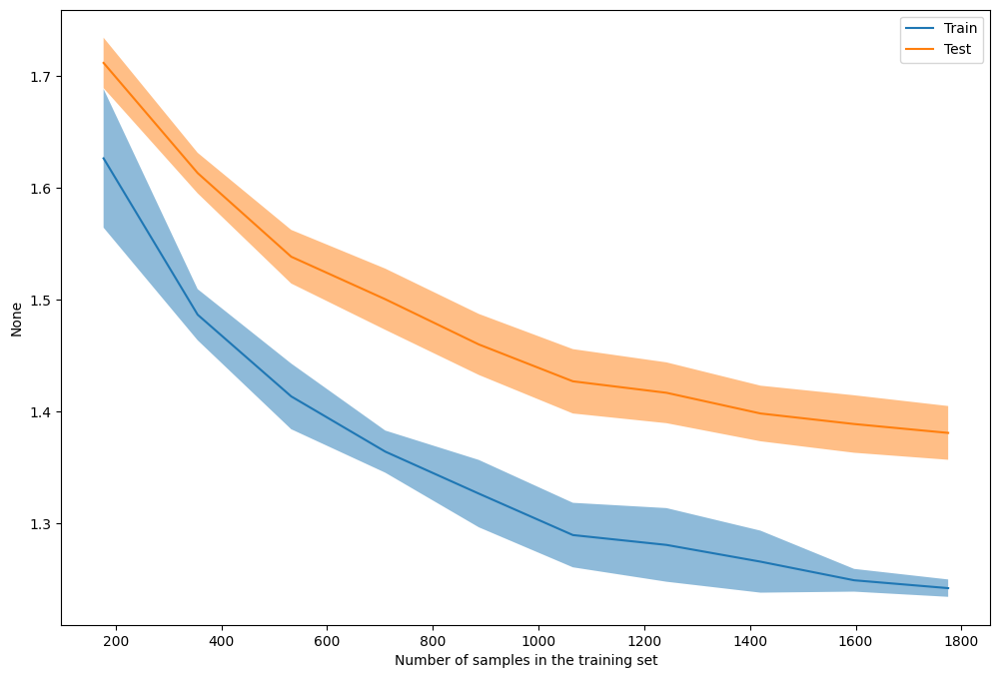

In [34]:
xgb_params = {
        'booster': final_params['booster'],
        #'multi:softmax' -> looks for accuracy; 'multi:softprob' looks for probability
        'objective': 'multi:softprob', #trial.suggest_categorical('objective',['multi:softmax','multi:softprob']),
        'n_estimators':final_params['n_estimators'],
        #'num_class': num_class,
        'tree_method':final_params['tree_method'],
        'gamma': final_params['gamma'],
        'eta': final_params['eta'],
        'max_delta_step': final_params['max_delta_step'],
        'min_child_weight': final_params['min_child_weight'],
        'grow_policy': final_params['grow_policy'],
        'subsample': final_params['subsample'],
        'colsample_bytree': final_params['colsample_bytree'],
        'colsample_bylevel': final_params['colsample_bylevel'],
        'colsample_bynode': final_params['colsample_bynode'],
        'alpha': final_params['alpha'],
        'lambda': final_params['lambda'],
        'eval_metric':'mlogloss',
        #'nthread':-1,
        'verbosity':0,
        #'seed':101

    }
if xgb_params['tree_method'] in ['hist','approx']:
    xgb_params['max_bins'] = final_params['max_bins']
if xgb_params['booster'] == 'dart':
    xgb_params['sample_type']= final_params['sample_type']
    xgb_params['normalize_type']= final_params['normalize_type']
    xgb_params['rate_drop']= final_params['rate_drop']
    xgb_params['one_drop']= final_params['one_drop']
    xgb_params['skip_drop']= final_params['skip_drop']
if xgb_params['grow_policy']=='depthwise':
    xgb_params['max_depth']=final_params['max_depth']
elif xgb_params['grow_policy']=='lossguide':
    xgb_params['max_leaves']=final_params['max_leaves']
    xgb_params['max_depth']=0

if xgb_params['subsample']>1.0:
    xgb_params['subsample']=1.0
if xgb_params['colsample_bytree']>1.0:
    xgb_params['colsample_bytree']=1.0
if xgb_params['colsample_bylevel']>1.0:
    xgb_params['colsample_bylevel']=1.0
if xgb_params['colsample_bynode']>1.0:
    xgb_params['colsample_bynode']=1.0

xgboost_final_pipeline=Pipeline(
        [
            ('NewFeatures',NewFeatureCreate()),
            ('Club_weight', ClubWeightadder(columns=['Club_Left'],top_club_weights={'Manchester City': 27,'Real Madrid': 26,'FC Bayern München': 25,'FC Paris Saint-Germain': 24,'Inter Mailand': 23,'FC Barcelona': 22,
                                                'FC Arsenal': 21,'FC Liverpool': 20,'Atlético Madrid': 19,'Borussia Dortmund': 18,'Juventus Turin': 17,'AC Mailand': 16,'Manchester United': 15,'RasenBallsport Leipzig': 14,
                                                'FC Chelsea': 13,'SSC Neapel': 12,'Newcastle United': 11,'Bayer 04 Leverkusen': 10,'AS Monaco': 9,'Olympique Marseille': 8,'Ajax Amsterdam': 7,'FC Porto': 6,'Benfica Lissabon': 5,
                                                'Sporting Lissabon': 4,'Galatasaray': 3,'Fenerbahce': 2,'Tottenham Hotspur': 1},non_top_weight=0.05)),
            ('TopClubs',TopClubTransformer(columns=[('Club_Left','League_Left')])),
            ('League_Weight',LeagueWeightEncoder(top_league_weights={'Premier League': 5,'LaLiga': 4,'Bundesliga': 3,'Serie A': 2,'Ligue 1': 1 },columns=['League_Left'])),
            ('TopLeague',TopLeagueTransformer(['League_Left'])),
            ('Nation Binning',RareLabelEncoder(variables='Nation',tol=final_params['nation_tol'])),
            ('Club_Left Binning', RareLabelEncoder(variables='Club_Left',tol=final_params['club_left_tol'])),
            ##('League_Left Binning', RareLabelEncoder(variables='League_Left',tol=0.001)),
            ('One-Hot Encoder',OneHotEncoder(variables=['Age','Pos'],drop_last=True)),
            ('Position_Score_FW', PositionScore(pos='FW', balanced_classes=True)),
            ('Position_Score_MF', PositionScore(pos='MF', balanced_classes=True)),
            ('Position_Score_DF', PositionScore(pos='DF', balanced_classes=True)),
            ('Position_Score_GK', PositionScore(pos='GK', balanced_classes=True)),
            ('Class Target Encoding',CatBoostEncoder(cols=['Nation','Club_Left','League_Left'],random_state=101)),
            ('Feature Selector Classification',Feature_Selector_Classification(threshold=final_params['feature_select_thresh'], random_state=101)),
            ('XGBoost Classifier',XGBClassifier(**xgb_params,nthreat=-1,seed=101))
        ]
)

train_sizes,train_scores,val_scores=learning_curve(
    estimator=xgboost_final_pipeline,
    X=X_train,
    y=y_train_enc,
    groups=groups_fit,
    train_sizes=np.linspace(0.1,1.0,10),
    cv=cv,
    shuffle=True,
    scoring='neg_log_loss',
    n_jobs=-1,
    random_state=101
)

for train_size, cv_train_scores, cv_val_scores in zip(train_sizes, train_scores, val_scores):
    print(f'Train Size: {np.mean(train_size)} | Train Score: {np.mean(cv_train_scores)*-1} | Val Score: {np.mean(cv_val_scores)*-1}')


fig, ax = plt.subplots(figsize=(12,8))
display_lc=LearningCurveDisplay(
    train_sizes=(train_sizes),
    train_scores=(train_scores)*-1,
    test_scores=(val_scores)*-1
)
display_lc.plot(ax=ax)

### Classification Report Catboost

c:\Users\gandj\OneDrive\Desktop\Case_Study\Football\Transfers\Transfer_Target_Model\venv\Lib\site-packages\sklearn\calibration.py:330: FutureWarning: The `cv='prefit'` option is deprecated in 1.6 and will be removed in 1.8. You can use CalibratedClassifierCV(FrozenEstimator(estimator)) instead.
  warnings.warn(


Log Loss Score: 1.4030112550115046
Macro F1-Score: 0.44787985181474094
              precision    recall  f1-score   support

           0       0.60      0.32      0.42        78
           1       0.60      0.46      0.52       112
           2       0.34      0.28      0.31        71
           3       0.43      0.65      0.52       187
           4       0.34      0.37      0.35        84
           5       0.62      0.51      0.56       156

    accuracy                           0.48       688
   macro avg       0.49      0.43      0.45       688
weighted avg       0.50      0.48      0.48       688

Top-1: 0.4796511627906977
Top-3: 0.7950581395348837
Top-5: 0.9447674418604651


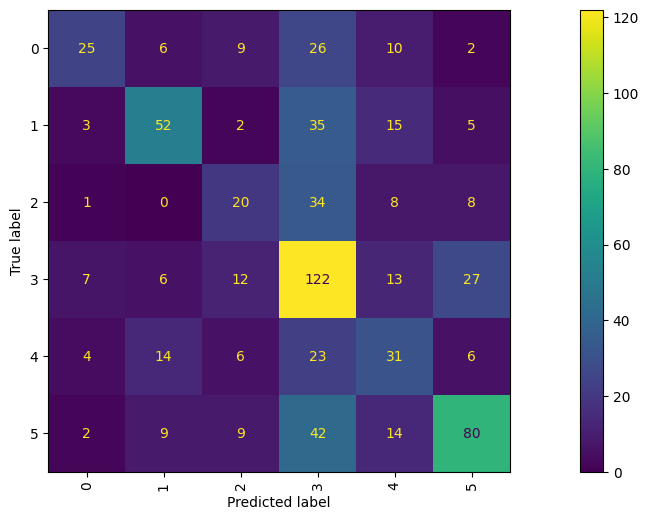

In [35]:
xgboost_final_pipeline=Pipeline(
        [
            ('NewFeatures',NewFeatureCreate()),
            ('Club_weight', ClubWeightadder(columns=['Club_Left'],top_club_weights={'Manchester City': 27,'Real Madrid': 26,'FC Bayern München': 25,'FC Paris Saint-Germain': 24,'Inter Mailand': 23,'FC Barcelona': 22,
                                                'FC Arsenal': 21,'FC Liverpool': 20,'Atlético Madrid': 19,'Borussia Dortmund': 18,'Juventus Turin': 17,'AC Mailand': 16,'Manchester United': 15,'RasenBallsport Leipzig': 14,
                                                'FC Chelsea': 13,'SSC Neapel': 12,'Newcastle United': 11,'Bayer 04 Leverkusen': 10,'AS Monaco': 9,'Olympique Marseille': 8,'Ajax Amsterdam': 7,'FC Porto': 6,'Benfica Lissabon': 5,
                                                'Sporting Lissabon': 4,'Galatasaray': 3,'Fenerbahce': 2,'Tottenham Hotspur': 1},non_top_weight=0.05)),
            ('TopClubs',TopClubTransformer(columns=[('Club_Left','League_Left')])),
            ('League_Weight',LeagueWeightEncoder(top_league_weights={'Premier League': 5,'LaLiga': 4,'Bundesliga': 3,'Serie A': 2,'Ligue 1': 1 },columns=['League_Left'])),
            ('TopLeague',TopLeagueTransformer(['League_Left'])),
            ('Nation Binning',RareLabelEncoder(variables='Nation',tol=final_params['nation_tol'])),
            ('Club_Left Binning', RareLabelEncoder(variables='Club_Left',tol=final_params['club_left_tol'])),
            ##('League_Left Binning', RareLabelEncoder(variables='League_Left',tol=0.001)),
            ('One-Hot Encoder',OneHotEncoder(variables=['Age','Pos'],drop_last=True)),
            ('Position_Score_FW', PositionScore(pos='FW', balanced_classes=True)),
            ('Position_Score_MF', PositionScore(pos='MF', balanced_classes=True)),
            ('Position_Score_DF', PositionScore(pos='DF', balanced_classes=True)),
            ('Position_Score_GK', PositionScore(pos='GK', balanced_classes=True)),
            ('Class Target Encoding',CatBoostEncoder(cols=['Nation','Club_Left','League_Left'],random_state=101)),
            ('Feature Selector Classification',Feature_Selector_Classification(threshold=final_params['feature_select_thresh'], random_state=101)),
            ('XGBoost Classifier',XGBClassifier(**xgb_params,nthreat=-1,seed=101))
        ]
)
xgboost_final_pipeline.fit(X_train,y_train_enc)

ccv=CalibratedClassifierCV(estimator=xgboost_final_pipeline,method='sigmoid',cv='prefit')
ccv.fit(X_cal,y_cal_enc)

y_proba=ccv.predict_proba(X_test)
y_pred=ccv.predict(X_test)

print(f'Log Loss Score: {log_loss(y_test_enc,y_proba)}')

print(f'Macro F1-Score: {f1_score(y_test_enc,y_pred,average="macro")}')

print(classification_report(y_test_enc,y_pred))

cm=confusion_matrix(y_test_enc,y_pred)
fig, ax = plt.subplots(figsize=(18,6))
CM=ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=ccv.classes_)
CM.plot(ax=ax)
plt.xticks(rotation=90)

# top-1 (normal accuracy)
acc1 = top_k_accuracy_score(y_test_enc, y_proba, k=1,labels=ccv.classes_)

# top-3
acc3 = top_k_accuracy_score(y_test_enc, y_proba, k=3,labels=ccv.classes_)

# top-5
acc5 = top_k_accuracy_score(y_test_enc, y_proba, k=5,labels=ccv.classes_)

print("Top-1:", acc1)
print("Top-3:", acc3)
print("Top-5:", acc5)

In [36]:
joblib.dump(ccv,'..\..\Models\Final_Model\XGBoost_Class_Prob_League.pkl')

['..\\..\\Models\\Final_Model\\XGBoost_Class_Prob_League.pkl']

In [8]:
joblib.dump(le,'..\..\Models\Final_Encoder\LabelEncoder.pkl')

['..\\..\\Models\\Final_Encoder\\LabelEncoder.pkl']

In [ ]:
performance_dict={
    'XGBoost Classification': {'Log Loss':best_score,'Macro F1-Score':f1_score(y_test_enc,y_pred,average="macro"),'Run Time in Minutes':round((end_time - start_time)/60,2)}
}
performance_df=pd.DataFrame.from_dict(performance_dict,orient='index')

file_path = r'..\..\Models\Performance\Performance.csv'

save_model_performance(performance_df,file_path)

In [14]:
final_df=pd.read_csv('..\..\Models\Performance\Performance.csv').iloc[1:,4:].reset_index(drop=True)
final_df.insert(0,column='Model',value=pd.Series(['Logistic_Regression','LightGBM','XGBoost']))
final_df.to_csv('..\..\Models\Performance\Final_Performance.csv',index=False)

## Model Performance Predict Probability

In [7]:
per_overview=pd.read_csv('..\..\Models\Performance\Final_Performance.csv')
per_overview

,Model,Log Loss,Macro F1-Score,Run Time in Minutes
0,Logistic_Regression,1.579359,0.343205,152.19
1,LightGBM,1.455552,0.419618,31.92
2,XGBoost,1.421224,0.443492,26.03


The best model is the XGBoost model, in therems of log loss, macro F1 score and and run time. When we look at the k-accuracy levels, XGBoost confinces us as well. The top-1 and top-3 are the best, which is very important. These values indicates, how well the model includes/predicts the correct class/label. Having top-1: 0.48 and top-3: 0.8, indicates what we predict almost 50% of the time teh correct class, when including three classes, even 80%.

In [6]:
output_=who_is_that_player('Jonathan Tah')
output_

,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,G+A,...,Stp%,#OPA,#OPA/90,AvgDist,Limited_Time,Age_Num,Transfer_Window,Club_Left,League_Left,Performance_Year
6598,GER,DF,Late Twenties,32.5,31.0,2741.5,30.45,2.5,0.75,3.25,...,0.0,0.0,0.0,0.0,0.0,26.5,2025,Leverkusen,BundesLiga,2024


In [58]:
final_model=joblib.load('..\..\Models\Final_Model\XGBoost_Class_Prob_League.pkl')
le = joblib.load('..\..\Models\Final_Encoder\LabelEncoder.pkl')

# get probabilities for player
proba = final_model.predict_proba(who_is_that_player('Thomas Meunier'))[0]

# map probabilities to leagues
probabilities = dict(zip(le.classes_, proba))
df_proba=pd.DataFrame.from_dict(probabilities,orient='index').rename(columns={0:'Probabilities'})
df_proba['Probabilities']=df_proba['Probabilities']*100
df_proba.sort_values('Probabilities',ascending=False)

,Probabilities
Other Leagues,64.587666
Ligue 1,8.924962
Premier League,7.042718
LaLiga,7.016635
Serie A,6.350425
Bundesliga,6.077593


# To-Do List

- create a new feature which addresses interests of top teams

In [36]:
who_is_that_player('Aarón Martín')

,Nation,Pos,Age,MP,Starts,Min,90s,Gls,Ast,G+A,...,Stp%,#OPA,#OPA/90,AvgDist,Limited_Time,Age_Num,Transfer_Window,Club_Left,League_Left,Performance_Year
38,ESP,DF,Late Twenties,29.0,26.0,2230.5,24.8,0.0,4.5,4.5,...,0.0,0.0,0.0,0.0,0.0,26.5,2025,Genoa,Serie A,2024


In [43]:
df['League_Left'].unique()

array(['Premier League', 'Serie A', 'Ligue 2', 'Championship',
       'Premier League 2', 'Ligue 1', 'LaLiga', 'Bundesliga', 'Serie B',
       '2ª División', '2. Bundesliga', 'Premier Liga', 'JPL',
       'Liga Profesional (- 23/24)', 'Super League 1', 'Liga Portugal',
       'MLS', 'LaLiga2', 'Série A', 'Süper Lig', 'Liga MX Apertura',
       'Serie D - I', 'CPL', 'League One', 'Primera División Clausura',
       'Eredivisie', 'Segunda División', 'Liga AUF Clausura',
       'Super League', 'Primera Federación - Gr. II',
       'Segunda Federación - Gr. III', 'Saudi Pro League',
       'Primera Federación - Gr. I', '3. Liga', 'Serie C-A',
       'Fortuna Liga'], dtype=object)

In [50]:
df[df['League_Joined'].eq('Bundesliga')]['League_Left'].unique()

array(['LaLiga', 'Bundesliga', 'Ligue 1', 'Premier League',
       '2. Bundesliga', 'Premier Liga', 'Championship', 'Serie A',
       'Premier League 2', 'LaLiga2', 'JPL', 'Liga Portugal', 'Serie B',
       'Ligue 2', '2ª División', '3. Liga', 'Süper Lig', 'Série A'],
      dtype=object)

In [56]:
df[df['League_Left'].eq('Süper Lig')]

,Player,Nation,Squad,Pos,Age,League,MP,Starts,Min,90s,...,AvgDist,Limited_Time,Age_Num,Transfer_Window,Club_Left,League_Left,Club_Joined,League_Joined,Transfer_Fee,Performance_Year
618,Cédric Bakambu,COD,Marseille,MF,Early Thirties,Ligue 1,3.0,0.0,59.0,0.7,...,0.0,1.0,31.0,2023,Galatasaray,Süper Lig,Real Betis Sevilla,LaLiga,5000000.0,2022.0
901,Eric Bailly,CIV,Marseille,DF,Late Twenties,Ligue 1,17.0,5.0,543.0,6.0,...,0.0,0.0,28.0,2023,Besiktas JK,Süper Lig,FC Villarreal,LaLiga,0.0,2022.0
1430,Jean Onana,CMR,Lens,MF,Early Twenties,Ligue 1,21.0,9.0,810.0,9.0,...,0.0,0.0,22.0,2023,Besiktas JK,Süper Lig,Olympique Marseille,Ligue 1,0.0,2022.0
1431,Jean Onana,CMR,Marseille,MF,Early Twenties,Ligue 1,13.0,5.0,566.0,6.3,...,0.0,0.0,23.0,2024,Besiktas JK,Süper Lig,Genua CFC,Serie A,0.0,2023.0
1831,Lionel Carole,FRA,Sevilla,DF,Late Twenties,LaLiga,6.0,6.0,540.0,6.0,...,0.0,1.0,26.0,2018,Galatasaray,Süper Lig,RC Straßburg Alsace,Ligue 1,750000.0,2017.0
1973,M'Baye Niang,SEN,Auxerre,FW,Late Twenties,Ligue 1,30.0,17.0,1482.0,16.5,...,0.0,0.0,27.0,2023,Adana Demirspor,Süper Lig,FC Empoli,Serie A,250000.0,2022.0
2256,Mergim Berisha,DEU,Augsburg,FW,Early Twenties,BundesLiga,23.0,20.0,1679.0,18.7,...,0.0,0.0,24.0,2023,Fenerbahce,Süper Lig,FC Augsburg,Bundesliga,4000000.0,2022.0
2260,Merih Demiral,TUR,Sassuolo,DF,Early Twenties,Serie A,14.0,14.0,1260.0,14.0,...,0.0,0.0,20.0,2019,Alanyaspor,Süper Lig,US Sassuolo,Serie A,8000000.0,2018.0
2337,Mostafa Mohamed,EGY,Nantes,FW,Early Twenties,Ligue 1,36.0,18.0,1939.0,21.5,...,0.0,0.0,24.0,2023,Galatasaray,Süper Lig,FC Nantes,Ligue 1,5750000.0,2022.0
2431,Nicolò Zaniolo,ITA,Aston Villa,FW,Early Twenties,Premier League,25.0,9.0,839.0,9.3,...,0.0,0.0,24.0,2024,Galatasaray,Süper Lig,Atalanta Bergamo,Serie A,0.0,2023.0
